# 4. **makemore** (part 3): activations & gradients, batchnorm

In [1]:
import sys

if "google.colab" in sys.modules:
    print("Running in Google Colab. Installing dependencies...")
    !pip install -r https://raw.githubusercontent.com/ckarageorgkaneen/micrograduate/main/requirements.txt -q --upgrade

## Intro

Here, we will continue our implementation of **makemore**. In the previous lesson, we implemented an character-level language model using a **mlp** along the lines of [Bengio et al. 2003](https://dl.acm.org/doi/10.5555/944919.944966). The model took as inputs a few past characters and predicted the next character in the sequence. What we would like to do is move on to more complex and larger **nn**s, like
- RNN, following [Mikolov et al. 2010](https://www.fit.vutbr.cz/research/groups/speech/publi/2010/mikolov_interspeech2010_IS100722.pdf)
- LSTM, following [Graves et al. 2014](https://arxiv.org/abs/1308.0850)
- GRU, following [Kyunghyun Cho et al. 2014](https://arxiv.org/abs/1409.1259)
- CNN, following [Oord et al., 2016](https://arxiv.org/abs/1609.03499)
- Transformer, following [Vaswani et al. 2017](https://arxiv.org/abs/1706.03762)

But before we do so, let's stick around at the level of the **mlp** for a little longer in order to develop an intuitive understanding of the activations during training, and especially the gradients flowing backwards: how they behave and how they look like. This is important for understanding the history of the development of newer architectures. Because, RNNs, as we'll see, for example, although they are very expressive, are universal function approximators and can in principle implement all algorithms, we will see that they are not that easily optimizable with the first-order gradient-based techniques that we have available to us and that we use all the time. The key to understanding why they are not easily optimizable, is to understand the activations and the gradients and how they behave during training. What we'll also see is that a lot of variants since RNNs, have tried to improve upon this situation. And so, that's the path that we have to take.

## Rebuilding **mlp**

So, let's get started by first building on the code from the previous lesson.

In [1]:
import random
random.seed(42)
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
%matplotlib ipympl
SEED = 2147483647

In [2]:
# read in all the words
words = open("names.txt", "r").read().splitlines()
words[:8]

['emma', 'olivia', 'ava', 'isabella', 'sophia', 'charlotte', 'mia', 'amelia']

In [3]:
len(words)

32033

In [4]:
# build the vocabulary of characters and mappings to/from integers
chars = sorted(list(set("".join(words))))
ctoi = {s: i + 1 for i, s in enumerate(chars)}
ctoi["."] = 0
itoc = {i: s for s, i in ctoi.items()}
vocab_size = len(itoc)
print(itoc)
print(vocab_size)

{1: 'a', 2: 'b', 3: 'c', 4: 'd', 5: 'e', 6: 'f', 7: 'g', 8: 'h', 9: 'i', 10: 'j', 11: 'k', 12: 'l', 13: 'm', 14: 'n', 15: 'o', 16: 'p', 17: 'q', 18: 'r', 19: 's', 20: 't', 21: 'u', 22: 'v', 23: 'w', 24: 'x', 25: 'y', 26: 'z', 0: '.'}
27


In [5]:
block_size = 3


def build_dataset(words):
    x, y = [], []
    for w in words:
        context = [0] * block_size
        for ch in w + ".":
            ix = ctoi[ch]
            x.append(context)
            y.append(ix)
            context = context[1:] + [ix]  # crop and append
    x = torch.tensor(x)
    y = torch.tensor(y)
    print(x.shape, y.shape)
    return x, y

In [6]:
random.shuffle(words)
n1 = int(0.8 * len(words))
n2 = int(0.9 * len(words))
xtrain, ytrain = build_dataset(words[:n1])
xval, yval = build_dataset(words[n1:n2])
xtest, ytest = build_dataset(words[n2:])

torch.Size([182625, 3]) torch.Size([182625])
torch.Size([22655, 3]) torch.Size([22655])
torch.Size([22866, 3]) torch.Size([22866])


In [7]:
def define_nn(
    n_hidden=200, n_embd=10, w1_factor=1.0, b1_factor=1.0, w2_factor=1.0, b2_factor=1.0
):
    global C, w1, b1, w2, b2
    g = torch.Generator().manual_seed(SEED)
    C = torch.randn((vocab_size, n_embd), generator=g)
    w1 = torch.randn(n_embd * block_size, n_hidden, generator=g) * w1_factor
    b1 = torch.randn(n_hidden, generator=g) * b1_factor
    w2 = torch.randn(n_hidden, vocab_size, generator=g) * w2_factor
    b2 = torch.randn(vocab_size, generator=g) * b2_factor
    parameters = [C, w1, b1, w2, b2]
    print(sum(p.nelement() for p in parameters))
    for p in parameters:
        p.requires_grad = True
    return parameters

In [8]:
def forward(x, y):
    emb = C[x]
    embcat = emb.view(emb.shape[0], -1)
    hpreact = embcat @ w1 + b1  # hidden layer pre-activation
    h = torch.tanh(hpreact)
    logits = h @ w2 + b2
    loss = F.cross_entropy(logits, y)
    return hpreact, h, logits, loss

In [9]:
def backward(parameters, loss):
    for p in parameters:
        p.grad = None
    loss.backward()

In [10]:
def update(parameters, lr):
    for p in parameters:
        p.data += -lr * p.grad

In [11]:
def train(x, y, initial_lr=0.1, maxsteps=200000, batchsize=32, redefine_params=False):
    global parameters
    lossi = []
    if redefine_params:
        parameters = define_nn()
    for p in parameters:
        p.requires_grad = True
    for i in range(maxsteps):
        bix = torch.randint(0, x.shape[0], (batchsize,))
        xb, yb = x[bix], y[bix]
        hpreact, h, logits, loss = forward(xb, yb)
        backward(parameters, loss)
        lr = initial_lr if i < 100000 else initial_lr / 10
        update(parameters, lr=lr)
        # track stats
        if i % 10000 == 0:  # print every once in a while
            print(f"{i:7d}/{maxsteps:7d}: {loss.item():.4f}")
        lossi.append(loss.log10().item())
    return hpreact, h, logits, lossi

In [12]:
@torch.no_grad()  # this decorator disables gradient tracking
def print_loss(x, y, prefix=""):
    _, _, _, loss = forward(x, y)
    print(f"{prefix} {loss}")
    return loss

In [13]:
parameters = define_nn()
_, _, _, lossi = train(xtrain, ytrain)
print_loss(xtrain, ytrain, prefix="train")
print_loss(xval, yval, prefix="val");

11897
      0/ 200000: 25.1003
  10000/ 200000: 2.8556
  20000/ 200000: 2.5106
  30000/ 200000: 2.7042
  40000/ 200000: 2.0770
  50000/ 200000: 2.1161
  60000/ 200000: 1.9852
  70000/ 200000: 2.3270
  80000/ 200000: 2.1991
  90000/ 200000: 1.8811
 100000/ 200000: 1.9985
 110000/ 200000: 1.9426
 120000/ 200000: 2.2136
 130000/ 200000: 2.0609
 140000/ 200000: 2.0413
 150000/ 200000: 2.2900
 160000/ 200000: 2.5242
 170000/ 200000: 1.7602
 180000/ 200000: 2.2266
 190000/ 200000: 1.7511
train 2.1252450942993164
val 2.161210536956787


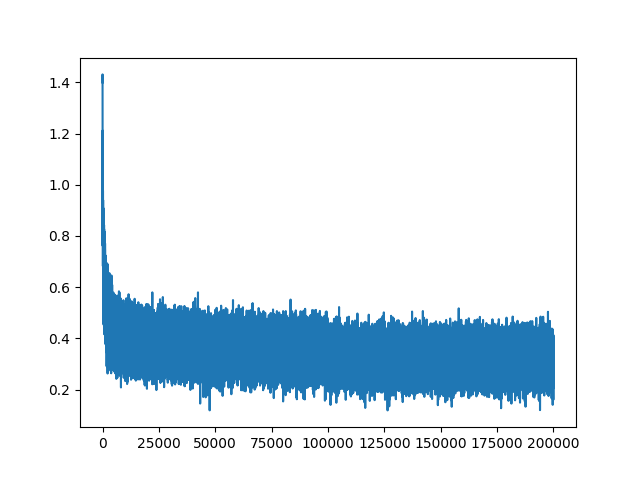

In [14]:
plt.figure()
plt.plot(lossi)

In [15]:
def sample_from_model():
    # sample from the model
    g = torch.Generator().manual_seed(SEED + 10)
    for _ in range(20):
        out = []
        context = [0] * block_size  # initialize with all ...
        while True:
            emb = C[torch.tensor([context])]  # (1,block_size,d)
            h = torch.tanh(emb.view(1, -1) @ w1 + b1)
            logits = h @ w2 + b2
            probs = F.softmax(logits, dim=1)
            ix = torch.multinomial(probs, num_samples=1, generator=g).item()
            context = context[1:] + [ix]
            out.append(ix)
            if ix == 0:
                break
        print("".join(itoc[i] for i in out))

In [16]:
sample_from_model()

eria.
kayah.
see.
mad.
rylle.
emman.
endraege.
dered.
elin.
shyloen.
eden.
edoriannelle.
malaia.
noshubergiagriel.
kindreeller.
nophir.
ubawn.
dariyah.
fael.
yumajahsanyah.


So that's our starting point. Awesome!

## Dealing with bad weights

Now, the first thing to scrutinize is the initialization. An experienced person would tell you that our network is very improperly configured at initialization and there are multiple things wrong with it. Let's start with the first one. If you notice the **loss** at iteration `0/200000`, it is rather high. This rapidly comes down to $2$ or so in the following training iterations. But you can tell that initialization is all messed up just by an initial **loss** that is way too high. In the training of **nn**s, it is almost always the case that you'll have a rough idea of what **loss** to expect at initialization. And that just depends on the **loss** function and the problem setup. In our case, we expect a number **much lower** than what we get. Let's calculate it together. Basically, there's $27$ characters that can come next for any one training example. At initialization, we have no reason to believe that any characters to be much more likely than others. So, we'd expect that the probability distribution that comes out initially is a uniform distribution, assigning about-equal probability to all the $27$ characters. This means that what we'd like the ideal probability we should record for any character coming next to be: 

In [17]:
ideal_p = torch.tensor(1.0 / 27)
ideal_p.item()

0.03703703731298447

And then the **loss** we would expect is the negative log probability:

In [18]:
expected_loss = -torch.log(ideal_p)
expected_loss.item()

3.295836925506592

So what's happening right now is that at initialization the network is creating probability distributions that are all messed up. Some characters are very confident and some characters are very not-confident. Basically, the network is very confidently wrong and that's what makes it record a very high **loss**. For simplicity, let's see a smaller, $4$-dimensional example of the issue, by assuming we only have $4$ characters.

In [19]:
def logits_4d(logits=torch.tensor([0.0, 0.0, 0.0, 0.0]), index=0):
    probs = torch.softmax(logits, dim=0)
    loss = -probs[index].log()
    return probs, loss.item()

In [20]:
logits_4d()

(tensor([0.2500, 0.2500, 0.2500, 0.2500]), 1.3862943649291992)

Suppose we have logits that come out of an **nn** that are all $0$. Then, when we calculate the softmax of these logits and get probabilities that are a diffused distribution that sums to $1$ and is exactly uniform. Whereas, the **loss** we get is the **loss** we would expect for a $4$-dimensional example with a uniform probability distribution. And so it doesn't matter whether the index is $0$, $1$, $2$ or $3$. We'll see of course that as we start to manipulate these logits, the loss changes. For example:

In [21]:
logits_4d(logits=torch.tensor([0.0, 0.0, 5.0, 0.0]), index=2)

(tensor([0.0066, 0.0066, 0.9802, 0.0066]), 0.020012274384498596)

Yields a very low **loss** since we are assigning the correct probability at initialization to the correct (3rd) label. Much more likely it is that some other dimension will have a high logit, e.g.

In [22]:
logits_4d(logits=torch.tensor([0.0, 5.0, 0.0, 0.0]), index=2)

(tensor([0.0066, 0.9802, 0.0066, 0.0066]), 5.020012378692627)

and then what happens is we start to record a much higher **loss**. So, what of course can happens is that the logits might take on extreme values and come out like this: 

In [23]:
logits_4d(logits=torch.tensor([-3.0, 5.0, 0.0, 2.0]), index=2)

(tensor([3.1741e-04, 9.4620e-01, 6.3754e-03, 4.7108e-02]), 5.055302619934082)

which also leads to a very high **loss**. For example, if logits are be relatively close to $0$, the loss is not too big. For example:

In [24]:
randn_logits = torch.randn(4)
print(randn_logits)
logits_4d(logits=randn_logits, index=2)

tensor([1.9208, 0.4453, 0.1784, 0.4650])


(tensor([0.6109, 0.1397, 0.1070, 0.1425]), 2.23525333404541)

However, if they are larger, it's very unlikely that you are going to be guessing the correct bucket and so you'd be confidently wrong and usually record a very high **loss**:

In [25]:
big_randn_logits = torch.randn(4) * 10
print(big_randn_logits)
logits_4d(logits=big_randn_logits, index=3)

tensor([-3.8393, 10.7668, 11.3310, -0.0165])


(tensor([1.6446e-07, 3.6256e-01, 6.3744e-01, 7.5207e-06]), 11.797852516174316)

For even more extreme logits, you might get extreme loss values:

In [26]:
huge_randn_logits = torch.randn(4) * 100
print(huge_randn_logits)
logits_4d(logits=huge_randn_logits, index=1)

tensor([   5.8083, -113.9903,   32.9336,   63.9694])


(tensor([5.5074e-26, 0.0000e+00, 3.3215e-14, 1.0000e+00]), inf)

Basically, such logits are not good and we want the logits to be roughly $0$ when the network is initialized. In fact, the logits don't need to be zero, they just have to be equal, e.g.:

In [27]:
logits_4d(logits=torch.tensor([3., 3., 3., 3.]), index=2)

(tensor([0.2500, 0.2500, 0.2500, 0.2500]), 1.3862943649291992)

Because of the normalization inside softmax, this will actually come out ok. But, for symmetry, we don't want it to be any arbitrary positive or negative number, just zero. So let's now concretely see where things go wrong in our initial example. First, let's reinitialize our network: 

In [28]:
parameters = define_nn()

11897


Then let's train it only for one step:

In [29]:
_, _, logits, _ = train(xtrain, ytrain, maxsteps=1)

      0/      1: 29.3249


If we print the logits, we'll see that they take on quite extreme values:

In [30]:
logits[0]

tensor([-10.2536,   5.9775,  -7.1489, -24.9037,  42.2538,  25.0085,   3.9199,
          5.0071, -11.4486,  18.8058,   8.7316,  -4.3542,   5.9717,  -6.2886,
          1.5429,  10.7016,  -2.5210,  15.6554,  18.4019,  10.6228,  14.5132,
         26.6826,   0.7221,   7.1046, -12.0349,   9.4563,  -5.1603],
       grad_fn=<SelectBackward0>)

which is what is creating the fake confidence and why the **loss** is so high. Let's now try to scale down the values of the some of our parameters (e.g. `w2`) and retrain for a step:

In [31]:
parameters = define_nn(w2_factor=0.1, b2_factor=0.0)
_ = train(xtrain, ytrain, maxsteps=1)

11897
      0/      1: 4.2585


Aha! The loss is lower, which makes sense. Let's try a smaller factor:

In [32]:
parameters = define_nn(w2_factor=0.01, b2_factor=0.0)
_ = train(xtrain, ytrain, maxsteps=1)

11897
      0/      1: 3.3217


The loss decreases further. Alright, so we're getting closer and closer... So, you might ask, why not just initialize the weights to $0.0$?

In [33]:
parameters = define_nn(w2_factor=0.0, b2_factor=0.0)
_ = train(xtrain, ytrain, maxsteps=1)

11897
      0/      1: 3.2958


Besides, it does yield an acceptable initial **loss** value. Well, you don't want to be setting the parameters of a **nn** exactly to $0$. You usually want it to be small numbers instead of exactly $0$. Let's see soon where things might go wrong if we set the initial parameters to $0$. For now, let's just consider the $0.01$ factor, which yields a small-enough initial **loss**:

In [34]:
parameters = define_nn(w2_factor=0.01, b2_factor=0.0)
_, _, logits, _ = train(xtrain, ytrain, maxsteps=1)

11897
      0/      1: 3.3171


The logits are now coming out as closer to $0$:

In [35]:
logits[0]

tensor([ 0.1227, -0.0890,  0.0043,  0.0625, -0.0881, -0.1561, -0.2041, -0.0130,
         0.1149, -0.1187, -0.0301,  0.2705,  0.0144, -0.1989,  0.0154,  0.0712,
        -0.1296,  0.1353,  0.1663, -0.0876, -0.0740, -0.0076, -0.0306, -0.0432,
        -0.1028, -0.0437,  0.0099], grad_fn=<SelectBackward0>)

Cool. So, let's now train the network completely, and see what losses we get.

In [36]:
parameters = define_nn(w2_factor=0.01, b2_factor=0.0)
_, _, _, lossi = train(xtrain, ytrain)

11897
      0/ 200000: 3.3215
  10000/ 200000: 2.2887
  20000/ 200000: 2.3659
  30000/ 200000: 2.0083
  40000/ 200000: 2.5293
  50000/ 200000: 2.4904
  60000/ 200000: 2.0512
  70000/ 200000: 2.5985
  80000/ 200000: 2.2251
  90000/ 200000: 2.0596
 100000/ 200000: 2.1050
 110000/ 200000: 2.4493
 120000/ 200000: 2.1542
 130000/ 200000: 2.2733
 140000/ 200000: 1.6679
 150000/ 200000: 1.9698
 160000/ 200000: 2.0433
 170000/ 200000: 1.7807
 180000/ 200000: 2.1016
 190000/ 200000: 2.2455


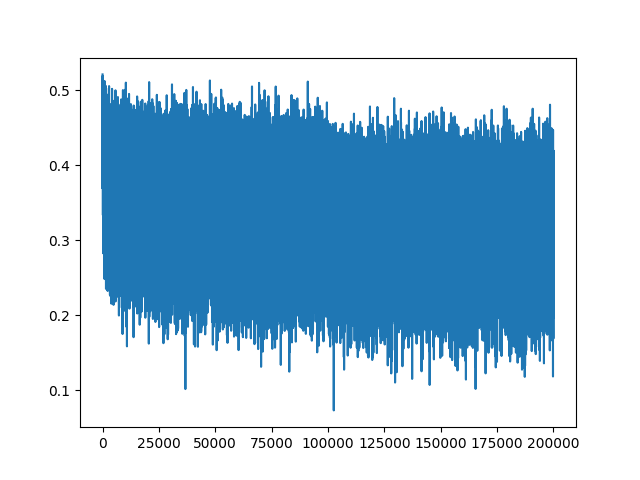

In [37]:
plt.figure()
plt.plot(lossi)

In [38]:
print_loss(xtrain, ytrain, prefix="train")
print_loss(xval, yval, prefix="val")

train 2.0687849521636963
val 2.1289448738098145


tensor(2.1289)

The **loss** gets smaller after the first step. Now, notice that our **loss** plot does not have the previous **loss** plot's hockey stick appearance. The reason is that that shape came from the optimization process basically squashing down the weights to a much smaller range than the initial one. But, now since we've already initialized the weights with small values, no such significant shrinking takes places, and thus no big **loss** drop happens between the first couple training steps. Therefore, we are not getting any easy gains, as we previously did in the beginning, but only just the hard gains from training. One important point to keep in mind is that the training and validation **losses** are now a bit better, since training now goes on for a bit longer, since the first epochs are no longer spent for squashing the parameters.

## Dealing with dead neurons

Now, time to deal with a second problem. Although our **loss** after initializing with smaller weights is low:

In [39]:
parameters = define_nn(w2_factor=0.01, b2_factor=0.0)
hpreact, h, logits, _ = train(xtrain, ytrain, maxsteps=1)

11897
      0/      1: 3.3203


the activation variable contains many $1.0$ and $-1.0$ values:

In [40]:
h

tensor([[ 1.0000, -0.9995, -0.9937,  ...,  0.9410, -1.0000, -0.9093],
        [-0.9909, -0.9567, -1.0000,  ..., -1.0000,  0.9998,  1.0000],
        [-0.9997, -0.9985, -0.9987,  ...,  0.9985, -1.0000, -0.9999],
        ...,
        [-0.7328,  0.9930, -0.9452,  ..., -0.6191, -0.9807,  1.0000],
        [-1.0000,  0.9604, -0.1418,  ..., -0.1266,  1.0000,  1.0000],
        [-0.9856, -0.5165,  0.7812,  ...,  0.9933, -1.0000,  1.0000]],
       grad_fn=<TanhBackward0>)

Now, `h` is the result of the $tanh$ activation function which is basically a squashing function that maps values within the $[-1.0, 1.0]$ range. To get an idea of the distribution of the values of `h`, let's look at its histogram.

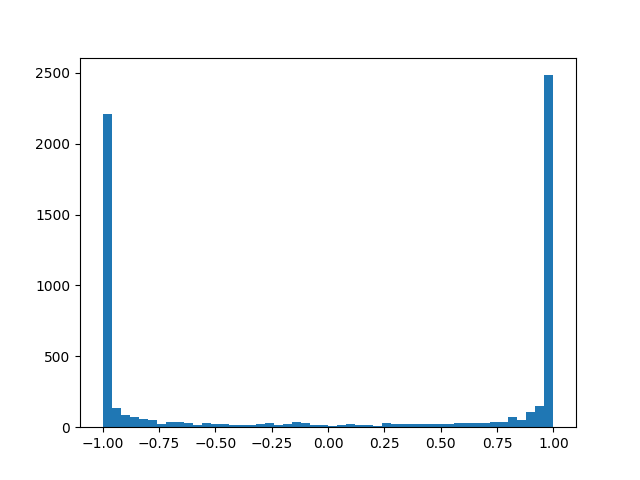

In [41]:
plt.figure()
plt.hist(h.view(-1).tolist(), 50);

We clearly see that most of the values of `h` are either $-1.0$ or $1.0$. So, this $tanh$ is very very active. We can look at why that is by plotting the pre-activations that feed into the $tanh$:

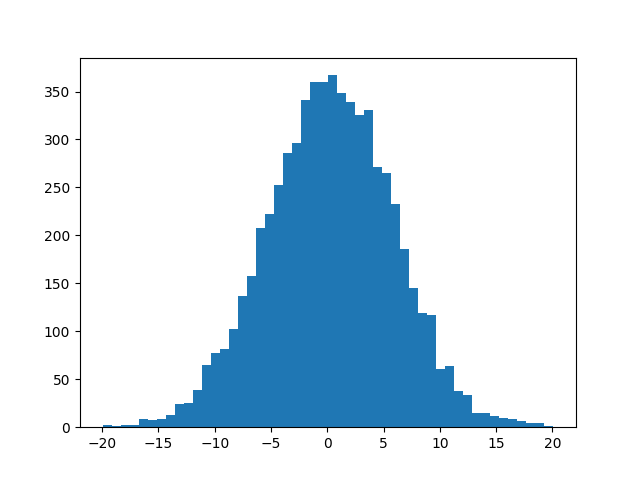

In [42]:
plt.figure()
plt.hist(hpreact.view(-1).tolist(), 50);

And we can see that the distribution of the preactivations is very very broad, with numbers between $-20$ and around $20$. That is why in the $tanh$ output values of $h$, everything is being squashed and capped to be in the $[-1.0, 1.0]$ range, with many extreme $-1.0$ and $1.0$ values. If you are new to **nn**s, you might not see this as an issue. But if you're well-versed in the dark arts of **backprop** and have an intuitive sense of how these gradients flow through a **nn**, you are looking at how the $tanh$ values are distributed and you are sweating! Either case, let's see why this is an issue. First and foremost, we have to keep in mind that during **backprop**, we do a backward pass by starting at the **loss** and flowing through the network backwards. In particular, we get to a point where we **backprop** through the $tanh$ function. If you scroll up to the `forward()` function, you'll see that the layer we first **backprop** through is the hidden **nn** layer (with parameters `w2`, `b2`), with `n_hidden` number of neurons, that implements an element-wise $tanh$ non-linearity. Now, let's look at what happens in $tanh$ in the backward pass. We can actually go back to our very first [**micrograd**](#1.-micrograd) implementation, in the first notebook and see how we implement $tanh$. This is how the gradient of $tanh$ is calculated: $(1 - t^2) \cdot \dfrac{\partial L}{\partial out}$.  If the value of $t$, the output of $tanh$ is $0$, then the $tanh$ neuron is basically *inactive* and the gradient of the previous layer just passes through. Whereas, if $t$ is $-1$ or $+1$, then the gradient becomes $0$. This means that if most of the `h` values (outputs of $tanh$) are close to the flat $-1$ and $+1$ regions of the $tanh$ output value range, then the gradients that are flowing through the network are getting destroyed at this layer: an unwanted side-effect. Let's further investigate the amount of `h` activation values that are concentrated at the flat regions:

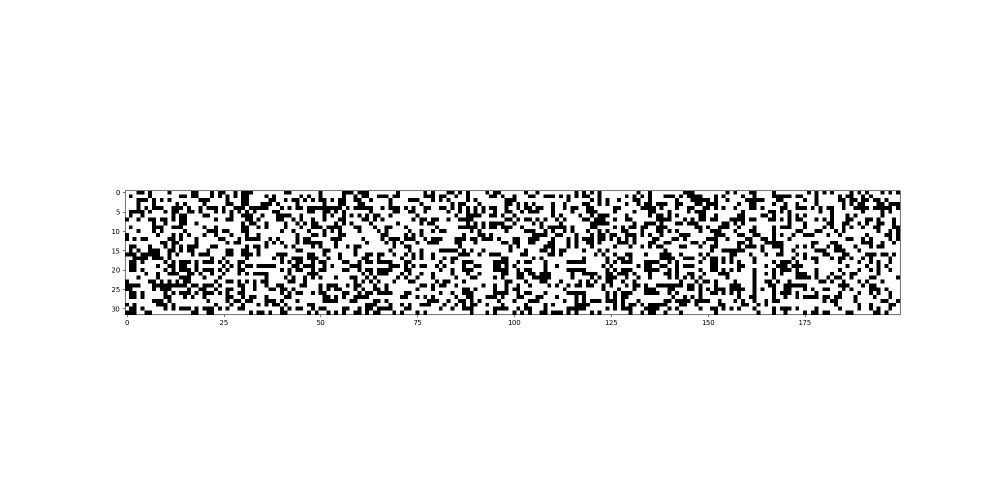

In [43]:
plt.figure(figsize=(20, 10))
plt.imshow(h.abs() > 0.99, cmap="gray", interpolation="nearest");

What we see in this data display are each one of the $200$ neurons (columns) per each of the $32$ examples/batches (rows). A white pixel represents a neuron whose output is in the flat $tanh$ region: either $-1$ or $+1$. Whereas, a black pixel represents a neuron whose output is in-between those flat region values. In other words, the white neurons are all the maximum-valued neurons that block the flow of gradients during **backprop**. Of course, we would be in grave trouble if for all of these $200$ neurons in each column (across all batches) were white. Because in that case we would have what we call a *dead neuron*. This would be a case wherein the initialization of weights and biases is such that no single example (batch) ever activates a neuron in the active region of the $tanh$ value range, in between the flat, saturated regions. Since our display does not contain any column of all-whites, for each neuron of our **nn**, there are least one or a couple of neurons that activate in the active region, meaning that some gradients will flow through and each neuron will learn. Nevertheless, cases of *dead neurons* are possible and the way this manifests (e.g. for $tanh$ neurons) is that no matter what inputs you plug in from your dataset, these *dead neurons* only fire either completely $+1$ or completely $-1$ and then these neurons will just not learn, because all the gradients will be zeroed out. These scenarios are not only true for $tanh$, but for many other non-linearities that people use in **nn**s.

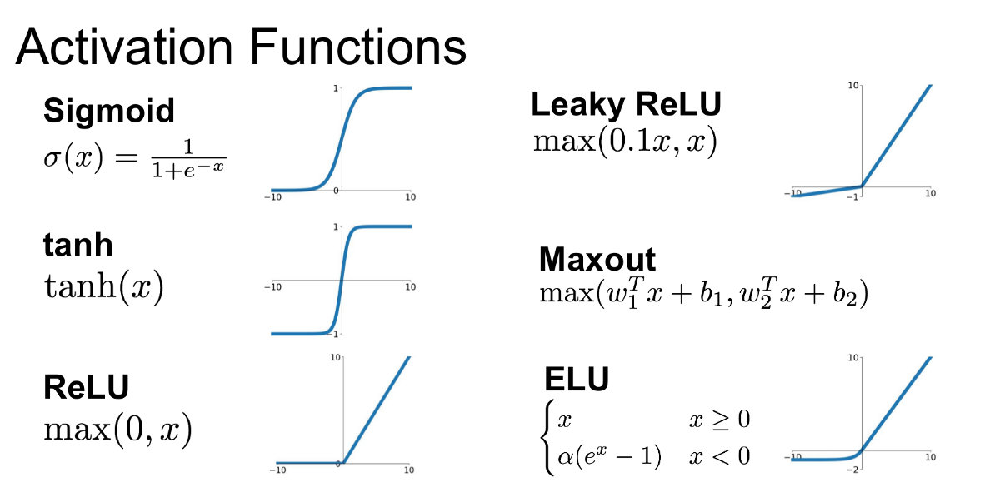

In [44]:
from IPython.display import Image, display
display(Image(filename='activations.png'))

For example, the $sigmoid$ activation function will have the exact same issues, as it is a similar squashing function. Now, consider $ReLU$, which has a completely flat region for negative input values. So, if you have a $ReLU$ neuron, it is a pass-through if it is positive and if the pre-activation value is negative, it will just shut it off, giving an output value of $0$. Therefore, if a neuron with a $ReLU$ non-linearity never activates, so for any inputs you feed it from the dataset it never turns on and remains always in its flat region, then this $ReLU$ neuron is considered a *dead neuron*: its weights and bias will never receive a gradient and will thus never learn, simply because the neuron never activated. And this can sometimes happen at initialization, because the weights and biases just make it so that by chance some neurons are forever dead. But it can also happen during optimization. If you have too high of a learning rate for example, sometimes you have these neurons that get too much of a gradient and get knocked out of the data manifold, resulting in no example ever activating such a neuron. Consequently, one danger with large gradient is knocking off neurons and making them forever dead. Other non-linearities such as $leaky ReLU$ will not suffer from this issue as much, because of the lack of flat tails, as they'll almost always yield gradients. But, to return to our $tanh$ issue, the problem is that our $tanh$ pre-activation `hpreact` values are too far away from $0$, thus yielding a flat region activation distribution that is too saturated at the `tanh` flat regions, which leads to a suppression of learning for many neurons. How do we fix this? One easy way is to decrease the initial value of the `w1` and `b1` parameters: 

11897
      0/      1: 3.3220


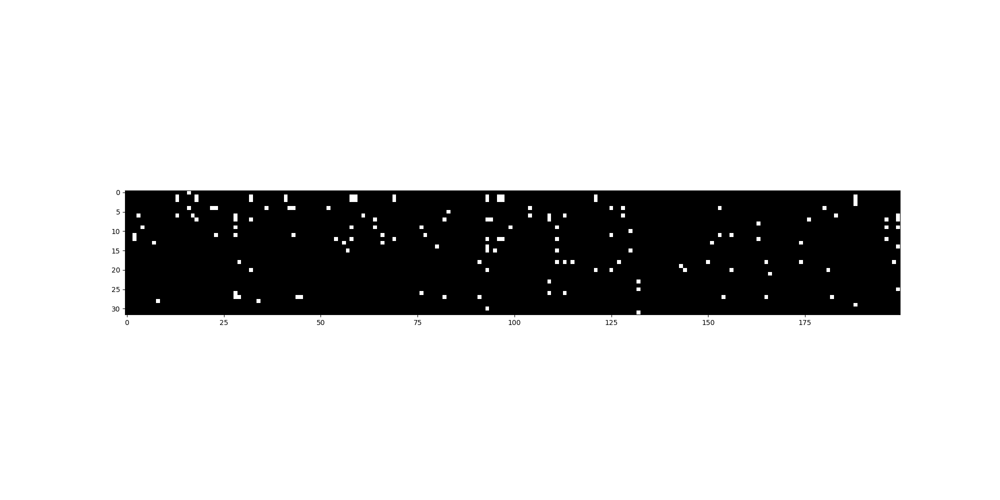

In [45]:
parameters = define_nn(w1_factor=0.2, b1_factor=0.01, w2_factor=0.01, b2_factor=0.0)
hpreact, h, logits, _ = train(xtrain, ytrain, maxsteps=1)
plt.figure(figsize=(20, 10))
plt.imshow(h.abs() > 0.99, cmap="gray", interpolation="nearest");

Now, our activations are not as saturated above 0.99 as they were before, with only a few white neurons. What is more, the activations are now more evenly distributed and the range of pre-activations is now significantly narrower:

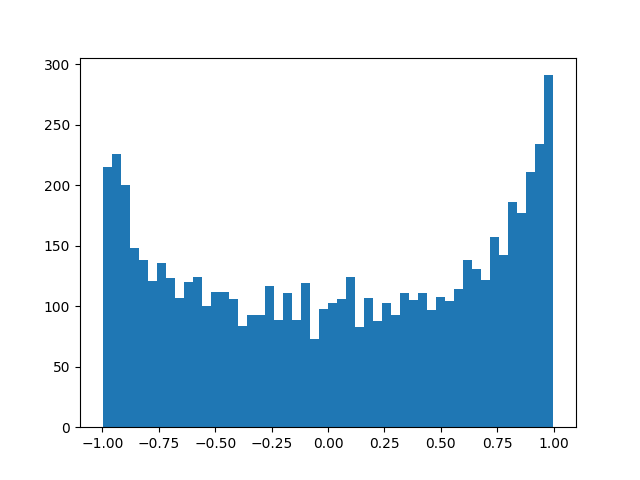

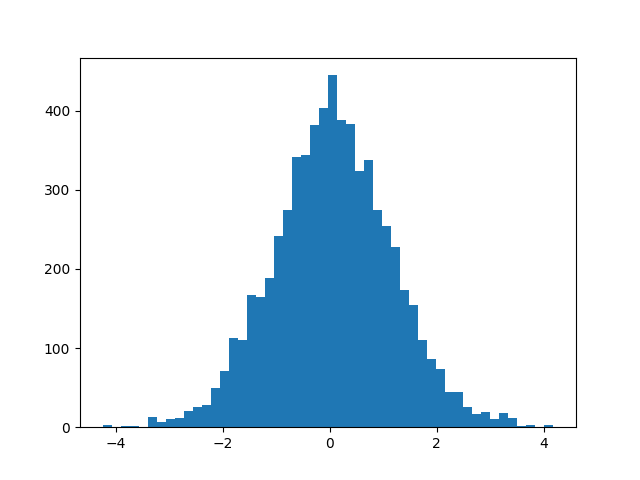

In [46]:
plt.figure()
plt.hist(h.view(-1).tolist(), 50)
plt.figure()
plt.hist(hpreact.view(-1).tolist(), 50);

Since distributions look nicer now, perhaps this is what our initialization should be. Let's now train a new network with this initialization setting and print the losses:

In [47]:
parameters = define_nn(w1_factor=0.2, b1_factor=0.01, w2_factor=0.01, b2_factor=0.0)
_ = train(xtrain, ytrain)

11897
      0/ 200000: 3.3200
  10000/ 200000: 2.3248
  20000/ 200000: 2.1765
  30000/ 200000: 2.2810
  40000/ 200000: 2.2333
  50000/ 200000: 2.2153
  60000/ 200000: 2.1478
  70000/ 200000: 2.2299
  80000/ 200000: 2.5281
  90000/ 200000: 2.1307
 100000/ 200000: 1.6033
 110000/ 200000: 2.0301
 120000/ 200000: 1.9939
 130000/ 200000: 2.2992
 140000/ 200000: 2.0378
 150000/ 200000: 1.6431
 160000/ 200000: 2.3025
 170000/ 200000: 1.8540
 180000/ 200000: 2.0420
 190000/ 200000: 2.0343


In [48]:
print_loss(xtrain, ytrain, prefix='train')
print_loss(xval, yval, prefix='val');

train 2.036611557006836
val 2.1025874614715576


The validation loss continues to improve! This exercise clarifies the effect of good initialization on performance and emphasizes being aware of **nn** internals like activations and gradients. Now, we're working with a very small network which is basically just a 1-hidden layer **mlp**. Because the network is so shallow, the optimization problem is quite easy and very forgiving. So, even though our initialization in the beginning was terrible, the network still learned eventually. It just got a bit of a worse result. This is not the case in general though. Once we actually start working with much deeper networks that have say 50 layers, things can get much more complicated and these problems stack up, and it is often not surprising to get into a place where a network is basically not training at all, if your initialization is bad enough. Generally, the deeper and more complex a network is, the less forgiving it is to some of the aforementioned errors. But what has worked so far with our simple example is great! However, we have come up with a bunch of *magic* weight and bias factors (e.g. `w1_factor`). How did we come up with these? And how are we supposed to set these if we have a large **nn** with lots and lots of layers? As you might assume, no one sets these by hand. And there's rather principled ways of setting these scales that I'd like to introduce to you now.

## Learning to set the factors

Let's start with a short snippet, just to begin to motivate this discussion by defining an input tensor of many multi-dimensional examples and a weight tensor of a hidden layer, both drawn from a Gaussian distribution. We'll calculate the mean and standard deviation of these inputs and the corresponding pre-activations:

In [49]:
def plot_x_y_distributions(n_inputs=10, weight_factor=1.0):
    x = torch.randn(1000, n_inputs)  # many examples of inputs
    w = torch.randn(n_inputs, 200) * weight_factor  # weights of the hidden layer
    y = x @ w  # pre-activations
    print(x.mean(), x.std())
    print(y.mean(), y.std())
    plt.figure(figsize=(20, 5))
    plt.subplot(121)
    plt.hist(x.view(-1).tolist(), 50, density=True)
    plt.subplot(122)
    plt.hist(y.view(-1).tolist(), 50, density=True)

tensor(0.0008) tensor(1.0004)
tensor(-0.0046) tensor(3.1142)


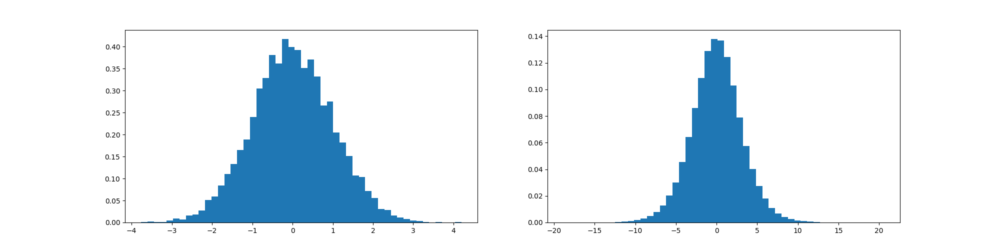

In [50]:
plot_x_y_distributions()

If you notice, the std of the pre-activations `y` has increased compared to that of `x`, as can also be seen by the widening of the Gaussian. The left Gaussian has basically undergone a stretching operation, resulting in the expanded right plot. We don't want that. We want most of our **nn** to have relatively similar activations with a relatively uniform Gaussian throughout the **nn**. So the question becomes, how do we scale these weight vectors (e.g. `w`) to preserve the Gaussian distribution of the inputs (e.g. left)? Let's do some experiments. If we scale `w` by a large number, e.g. $5$:

tensor(-0.0103) tensor(0.9910)
tensor(0.0086) tensor(15.3168)


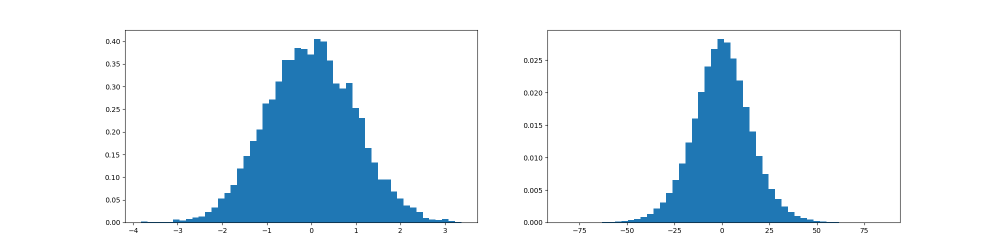

In [51]:
plot_x_y_distributions(weight_factor=5)

this Gaussian grows and grows in std, with the outputs in the x-axis taking on more and more extreme values (right plot). But if we scale the weights down, e.g. by $0.2$:

tensor(0.0008) tensor(0.9946)
tensor(0.0002) tensor(0.6237)


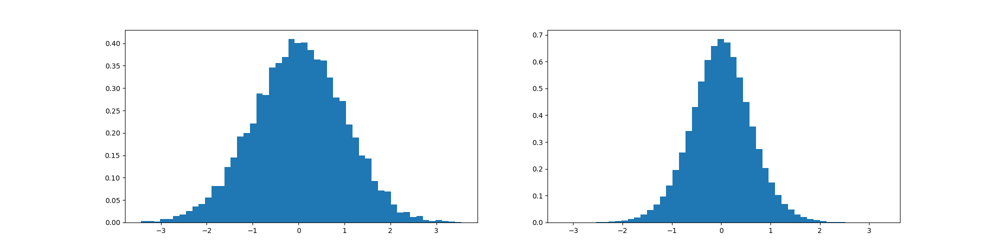

In [52]:
plot_x_y_distributions(weight_factor=0.2)

then, conversely, the Gaussian gets smaller and smaller and it's shrinking. Notice the std of `y` now being smaller than that of `x`. The question then becomes: what is the appropriate factor to exactly preserve the std of the inputs? And it turns out that the correct answer, mathematically, (when you work out the variance of the `x @ w` multiplication), is that you are supposed to divide by the square root of the fan-in. Meaning, the square root of the number of inputs. Therefore if the number of inputs is $10$ then the appropriate factor for preserving the Gaussian distribution of the inputs is $10^{-1/2}$.

tensor(0.0031) tensor(1.0003)
tensor(-0.0010) tensor(1.0054)


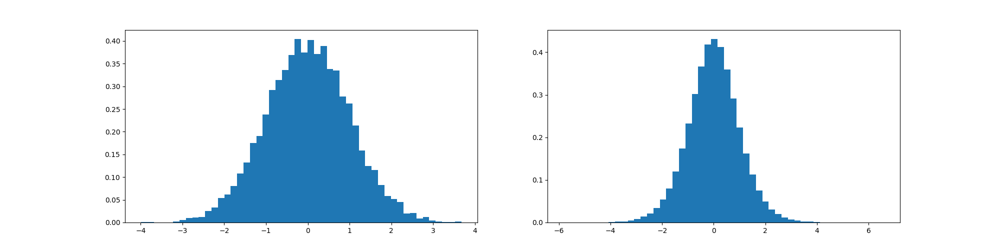

In [53]:
plot_x_y_distributions(n_inputs=10, weight_factor=10**-0.5)

Now we see that the std remains roughly the same! Now, unsuprisingly, a number of papers have looked into how to best initialize **nn**s and in the case of **mlp**s, we can have these fairly deep networks that have these nonlinearities in between layers and we want to make sure that the activations are well-behaved and they don't expand to infinity or shrink all the way to zero. And the question is, how do we initialize the weights so that they take on reasonable values throughout the network. In [Delving Deep into Rectifiers: Surpassing Human-Level Performance on ImageNet Classification](https://arxiv.org/abs/1502.01852), they study convolutional **nn**s (CNNs) and $ReLU$ and $PReLU$ non-linearities. But the analysis is very similar to the $tanh$ non-linearity. As we saw previously, $ReLU$ is somewhat of a squashing function where all the negative values are simply clamped to $0$. Because with $ReLU$s half of the distribution is thrown away, they find in their analysis of the forward activations of the **nn**, that you have to compensate for that with a gain. They find that to initialize their weights they have to do it with a zero-mean Gaussian whose std is $\sqrt{2/n_l}$. We just did the same, multiplying our weights by $\sqrt{1/10}$ (the $2$ has to do with the $ReLU$ activation function they use). They also study the backward propagation case, finding that the backward pass is also approximately initialized up to a constant factor $c_2/d_L$ that has to do with the number of hidden neurons in early and late layer. Now, this [Kaiming initialization is also implemented in pytorch](https://pytorch.org/docs/stable/nn.init.html#torch.nn.init.kaiming_normal_) and it is probably the most common way of initializing **nn**s now. This PyTorch method takes a mode and nonlinearity argument among others, with the latter determining the gain factor (e.g. $\sqrt{2}$). Why do we need a gain? For example, $ReLU$ is a contractive transformation that squashes the output distribution by taking any negative value and clamping it to zero. $tanh$ also squashes in some way, as it will squeeze values at the tails of its range. Therefore, in order to fight the squeezing-in of these activation functions, we have to boost the weights a little bit in order to counteract this effect and re-normalize everything back to standard unit deviation. So that's why there's a little bit of a gain that comes out. Now we're actually intentionally skipping through this section quickly. The reason for that is the following. Around 2015, when this paper was written, you had to actually be extremely careful with the activations and the gradients, their ranges, their histograms, the precise setting of gains and the scrutinizing of the non-linearities and so on... So, everything was very finicky and very fragile and everything had to be very properly arranged in order to train a **nn**. But there are a number of modern innovations that made everything significantly more stable and well-behaved. And it has become less important to initialize these networks "exactly right". Some of those innovations are for example: residual connections (which we will cover in the next notebooks), a number of normalization layers (e.g. batch normalization, layer normalization, group normalization) and of course much better optimizers: not just stochastic gradient descent (the simple optimizer we have been using), but slightly more complex optimizers such as RMSProp and especially Adam. All of these modern innovations make it less important for you to precisely calibrate the initialization of the **nn**. So, what do people do in practice? They usually initialize their weights with Kaiming-normally, like we did. Now notice how the following multiplier ends up being the std of Gaussian distribution:  

In [54]:
multiplier = 0.2
(torch.randn(10000) * multiplier).std().item()

0.19937172532081604

But, according to the [kaiming PyTorch docs](https://pytorch.org/docs/stable/nn.init.html#torch.nn.init.kaiming_normal_), we want an std of $\frac{gain}{\sqrt{fan\_in}}$. Therefore, for a $tanh$ nonlinearity:

In [55]:
n_embd = 10
kaiming_w1_factor = (5 / 3) / ((n_embd * block_size) ** 0.5)

Now let's re-initialize and re-train our **nn** with this initilization:

In [56]:
parameters = define_nn(
    w1_factor=kaiming_w1_factor, b1_factor=0.01, w2_factor=0.01, b2_factor=0.0
)
hpreact, _, _, _ = train(xtrain, ytrain)

11897
      0/ 200000: 3.3067
  10000/ 200000: 2.5053
  20000/ 200000: 1.7933
  30000/ 200000: 2.6845
  40000/ 200000: 1.9715
  50000/ 200000: 1.8196
  60000/ 200000: 2.2070
  70000/ 200000: 1.6954
  80000/ 200000: 2.5278
  90000/ 200000: 2.0004
 100000/ 200000: 2.1920
 110000/ 200000: 2.5179
 120000/ 200000: 2.2912
 130000/ 200000: 2.3415
 140000/ 200000: 2.0959
 150000/ 200000: 2.4515
 160000/ 200000: 2.1883
 170000/ 200000: 2.2401
 180000/ 200000: 1.8487
 190000/ 200000: 2.1206


In [57]:
print_loss(xtrain, ytrain, prefix='train')
print_loss(xval, yval, prefix='val');

train 2.037757158279419
val 2.1037580966949463


Of course, our **loss** is quite similar to before. The difference now though is that we don't need to inspect histograms and introduce arbitrary factors. On the contrary, we now have a semi-principled way to initialize our weights that is also scalable to much larger networks which we can use as a guide. However, this precise weight initialization is not as important as we might think nowadays, due to some modern innovations.

## Batchnorm

Let's now introduce one of them. Batch Normalization (**batchnorm**) came out in 2015 from a team at Google in [an extremely impactful paper](https://arxiv.org/abs/1502.03167), making it possible to train deep neural networks quite reliably. It basically just worked. Here's what **batchnorm** does and how it's implemented. Like we mentioned before, we don't want the pre-activations (e.g. `hpreact`) to $tanh$ to be too small, nor too large because then the outputs will turn out either close to $0$ or saturated. Instead, we want the pre-activations to be roughly Gaussian (with a zero mean and a std of $1$), at least at initialization. So, the insight from the **batchnorm** paper is: ok, we have these hidden pre-activation states/values that we'd like to be Gaussian, then why not take them and just normalize them to be Gaussian? Haha. I know, it sounds kinda crazy but you can just do that, because *standardizing* hidden states so that they become Gaussian is a perfectly differentiable operation. And so the gist of **batchnorm** is that if we want unit Gaussian hidden states in our network, then we can just normalize them to be so. Let's see how that works. If you scroll up to our definition of the `forward` function we can see the pre-activations `hpreact` before they are fed into the $tanh$ function. Now, the idea, remember, is we are trying to make these roughly Gaussian. If the values are too small, the $tanh$ is kind of inactive, whereas if they are very large, the $tanh$ becomes very saturated and the gradients don't flow. So, let's learn how to standardize `hpreact` to be roughly Gaussian.

In [58]:
hpreact.shape

torch.Size([32, 200])

In [59]:
hpmean = hpreact.mean(0, keepdim=True)
hpmean.shape

torch.Size([1, 200])

In [60]:
hpstd = hpreact.std(0, keepdim=True)
hpstd.shape

torch.Size([1, 200])

After calculating the mean and std across batches of `hpreact`, which in the paper are referred to the "mini-batch mean" and "mini-batch variance", respectively, next, following along the paper, we are going to normalize or standardize the inputs (e.g. `hpreact`) by subtracting the mean and dividing by the std. Basically:

In [61]:
hpreact = (hpreact - hpmean) / hpstd

What normalization does is that now every single neuron and its firing rate will be exactly unit Gaussian for each batch (which is why it's called **batchnorm**). Now, we could in principle train using normalization. But we would not achieve a very good result. And the reason for that is that we want the pre-activations to be roughly Gaussian, but only at initialization. But we don't want these to be forced to be Gaussian always. We'd like to allow the **nn** to move the distributions around, such as making them more diffuse, more sharp, perhaps to make some `tanh` neurons to be more trigger-happy or less trigger-happy. So we'd like this distribution to move around and we'd like the **backprop** to tell us how that distribution should move around. So in addition to standardization of any point in the network, we have to also introduce this additional component mentioned in the paper described as "scale and shift". Basically, what we want to be doing is multiplying the normalized values by a gain $\gamma$ and then addding a bias $\beta$ to get a final output of each layer. Let's define them:

In [62]:
bngain = torch.ones(1, hpreact.shape[1])
bnbias = torch.zeros(1, hpreact.shape[1])

so that:

In [63]:
hpreact = bngain * (hpreact - hpmean) / hpstd + bnbias

Because the gain is initialized to $1$ and the bias to $0$, at initialization, each neuron's firing values in this batch will be exactly unit Gaussian and we'll have nice numbers, regardless of what the distribution of the incoming (e.g. `hpreact`) tensors are. That is roughly what we want, at least during initialization. And during optimization, we'll be able to **backprop** and change the gain and the bias, so the network is given the full ability to do with this whatever it wants internally. In order to train these, we have to make sure to include these in the parameters of the **nn**. To do so, and by effect facilitate **backprop**, let's update our `define_nn`, `forward` functions accordingly:

In [64]:
def define_nn(
    n_hidden=200, n_embd=10, w1_factor=1.0, b1_factor=1.0, w2_factor=1.0, b2_factor=1.0
):
    global C, w1, b1, w2, b2, bngain, bnbias
    g = torch.Generator().manual_seed(SEED)
    C = torch.randn((vocab_size, n_embd), generator=g)
    w1 = torch.randn(n_embd * block_size, n_hidden, generator=g) * w1_factor
    b1 = torch.randn(n_hidden, generator=g) * b1_factor
    w2 = torch.randn(n_hidden, vocab_size, generator=g) * w2_factor
    b2 = torch.randn(vocab_size, generator=g) * b2_factor
    bngain = torch.ones((1, n_hidden))
    bnbias = torch.zeros((1, n_hidden))
    parameters = [C, w1, b1, w2, b2, bngain, bnbias]
    print(sum(p.nelement() for p in parameters))
    for p in parameters:
        p.requires_grad = True
    return parameters

In [65]:
def forward(x, y):
    emb = C[x]
    embcat = emb.view(emb.shape[0], -1)
    hpreact = embcat @ w1 + b1  # hidden layer pre-activation
    # batchnorm
    hpreact = (
        bngain
        * (hpreact - hpreact.mean(0, keepdim=True))
        / hpreact.std(0, keepdim=True)
        + bnbias
    )
    h = torch.tanh(hpreact)
    logits = h @ w2 + b2
    loss = F.cross_entropy(logits, y)
    return hpreact, h, logits, loss

And now, let's initialize our new **nn** and train!

In [66]:
parameters = define_nn(
    w1_factor=kaiming_w1_factor, b1_factor=0.01, w2_factor=0.01, b2_factor=0.0
)
_ = train(xtrain, ytrain)
print_loss(xtrain, ytrain, prefix="train")
print_loss(xval, yval, prefix="val");

12297
      0/ 200000: 3.3099
  10000/ 200000: 2.0408
  20000/ 200000: 2.2732
  30000/ 200000: 2.4020
  40000/ 200000: 2.2525
  50000/ 200000: 2.3505
  60000/ 200000: 1.9734
  70000/ 200000: 2.2446
  80000/ 200000: 2.1793
  90000/ 200000: 2.4219
 100000/ 200000: 1.7639
 110000/ 200000: 2.3857
 120000/ 200000: 2.1821
 130000/ 200000: 2.2479
 140000/ 200000: 1.9529
 150000/ 200000: 2.0070
 160000/ 200000: 2.1278
 170000/ 200000: 2.2597
 180000/ 200000: 2.0221
 190000/ 200000: 2.3284
train 2.0680389404296875
val 2.109663248062134


We get a loss that is comparable to our previous results. Here's a rough summary of our losses (re-running this notebook might yield slightly different values, but you get the point):

```python
# loss log

# original:
train 2.127638339996338
val 2.171938180923462

# fix softmax confidently wrong
train 2.0707266330718994
val 2.1337196826934814

# fix tanh layer saturated at init
train 2.0373899936676025
val 2.1040639877319336

# use semi-principled kaiming initialization instead of hacky way:
train 2.038806438446045
val 2.108304977416992

# add a batchnorm layer
train 2.0688135623931885
val 2.10699462890625
```

However, we should not actually be expecting an improvement in this case. And that's because we are dealing with a very simple **nn** that has just a single hidden layer. In fact, in this very simple case of just one hidden layer, we were actually able to calculate what the scale of the weights should be to have the activations have a roughly Gaussian shape. So, **batchnorm** is not doing much here. But you might imagine that once you have a much deeper **nn**, that has lots of different types of operations and there's also, for example, residual connections (which we'll cover) and so on, it will become very very difficult to tune the scales of the weight matrices such that all the activations throughout the **nn** are roughly Gaussian: at scale, an intractable approach. Therefore, compared to that, it is much much easier to sprinkle **batchnorm** layers throughout the **nn**.  In particular, it's common to look at every single linear layer like this one `hpreact = embcat @ w1 + b1` (multiply by a weight matrix and add a bias), or for example convolutions that also perform matrix multiplication, (just in a more "structured" format) and append a **batchnorm** layer right after it to control the scale of these activations at every point in the **nn**. So, we'd be adding such normalization layers throughout the **nn** to control the scale of these activation (again, throughout the **nn**) without requiring us to do perfect mathematics in order to manually control individual activation distributions for any "building block" (e.g. layer) we might want to introduce into our **nn**. So, **batchnorm** significantly stabilizes training and that's why these layers are quite popular. Beware though, the stability offered by **batchnorm** often comes at a terrible cost. If you think about it, what is happening at a **batchnorm** layer (e.g. `hpreact = bngain * (hpreact - hpreact.mean(0, keepdim=True)) / hpreact.std(0, keepdim=True) + bnbias`) is something strange and terrible. Before introducing such a layer, it used to be the case that a single example was fed into the **nn** and then we calculated its activations and its logits in a deterministic manner in which a specific example yields specific logits. Then, for reasons of efficiency of learning, we started to use batches of examples. Those batches of examples were processed independently, but this was just an efficient thing. But now suddenly, with **batchnorm**, because of the normalization through the batch, we are mathematically coupling these examples in the forward pass and the backward pass of the **nn**. So with **batchnorm**, the hidden states (e.g. `hpreact`) and the output states (e.g. logits), are not just a function of the inputs of a specific example, but they're also a function of all the other examples that happen to come for a ride in that batch. Damn! So what's happening is, if you see for example the activations `h = torch.tanh(hpreact)`, for every different example/batch, the activations are going to actually change slightly, depending on what other examples there are in the batch. Thus depending on what examples there are, `h` is going to jitter if you sample from many examples, since the statistics of the mean and std are going to be impacted. So, you'll get a jitter for the `h` and for the `logits` values. And you'd think that this would be a bug or something undesirable, but in a very strange way, this actually turns out to be good in **nn** training as a side effect. The reason for that is that you can think of **barchnorm** as some kind of regularizer. Because what is happening is the you have your input and your `h` and because of the other examples the value of `h` is jittering a bit. What that does is that is effectively padding-out any one of these input examples and it's introducing a little bit of entropy. And because of the padding-out, the jittering effect is actually kind of like a form of data augmentation, making it harder for the **nn** to overfit for these concrete specific examples. So, by introducing all this noise, it actually pads out the examples and it regularizes the **nn**. And that is the reason why, deceivingly, as a second-order effect, this is acts like a regularizer, making it harder for the us as a community to remove or do without **batchnorm**. Because, basically, no one likes this property that the examples in a batch are coupled mathematically in the forward pass and it leads to all kinds of strange results, bugs and so on. Therefore, people do not like these side effects so many have advocated for deprecating the use of **batchnorm** and move to other normalization techniques that do not couple the examples of a batch. Examples are layer normalization, instance normalization, group normalization, and so on. But basically, long story short, **batchnorm** is the first kind of normalization layer to be introduced, it worked extremely well, it happened to have this regularizing effect, it stabilized training and people have been trying to remove it and move unto the other normalization techniques. But it's been hard, because it just works quite well. And some of the reason it works quite well is because of this regularizing effect and because it is quite effective at controlling the activations and their distributions. So, that's the brief story of **batchnorm**. But let's see one of the other weird outcomes of this coupling. Basically, once we've trained a **nn**, we'd like to deploy it in some kind of setting and we'd like to feed in a single individual example and get a prediction out from our **nn**. But how can we do that when our **nn** now with **batchnorm** in a forward pass estimates the statistics of the mean and the std of a batch and not a single example? The **nn** expects batches as an input now. So how do we feed in a single example and get sensible results out? The proposal in the **batchnorm** paper is the following. What we would like to do is implement a step after training that calculates and sets the **batchnorm** mean and std a single time over the training dataset. Basically, calibrate the **batchnorm** statistics at the end of training as such. We are going to get the training dataset and get the pre-activations for every single training example, and then one single time estimate the mean and std over the entire training set: two fixed numbers. 

In [67]:
@torch.no_grad()  # disable gradient calculation
def infer_mean_and_std_over_trainset():
    # pass the entire training set through
    emb = C[xtrain]
    embcat = emb.view(emb.shape[0], -1)
    hpreact = embcat @ w1 + b1  # hidden layer pre-activation
    # measure the mean/std over the entire training set
    bnmean_xtrain = hpreact.mean(dim=0, keepdim=True)
    bnstd_xtrain = hpreact.std(dim=0, keepdim=True)
    return bnmean_xtrain, bnstd_xtrain

In [68]:
bnmean_xtrain, bnstd_xtrain = infer_mean_and_std_over_trainset()

And so after calculating these values, at test time we are going to clamp them to the **batchnorm** calculation. To do so, let's extend the `forward` and `print_loss` functions as such:

In [69]:
def forward(x, y, bnmean=None, bnstd=None):
    emb = C[x]
    embcat = emb.view(emb.shape[0], -1)
    hpreact = embcat @ w1 + b1  # hidden layer pre-activation
    # batchnorm
    if bnmean is None:
        bnmean = hpreact.mean(0, keepdim=True)
    if bnstd is None:
        bnstd = hpreact.std(0, keepdim=True)
    hpreact = bngain * (hpreact - bnmean) / bnstd + bnbias
    h = torch.tanh(hpreact)
    logits = h @ w2 + b2
    loss = F.cross_entropy(logits, y)
    return hpreact, h, logits, loss

In [70]:
@torch.no_grad()  # this decorator disables gradient tracking
def print_loss(x, y, prefix="", bnmean=None, bnstd=None):
    _, _, _, loss = forward(x, y, bnmean=bnmean, bnstd=bnstd)
    print(f"{prefix} {loss}")
    return loss

Now, if we do an inference with these mean and std values, instead of the batch-specific ones: 

In [71]:
print_loss(xtrain, ytrain, bnmean=bnmean_xtrain, prefix='train')
print_loss(xval, yval, bnstd=bnstd_xtrain, prefix='val');

train 2.0680389404296875
val 2.1097145080566406


The losses we get may be more or less the same as our last losses before, but the benefit we have gained is that we can now forward a single example, because now the mean and std are fixed tensors. That said, because everyone is lazy, nobody wants to estimate the mean and std as a second stage after **nn** training. So, the **batchnorm** paper also introduced one more idea: that we can estimate these mean and std values in a running manner during the **nn** training phase. Let's see what that would look like. First, we'll define running value variables in the definition of our **nn**. Then we'll modify the `train` function and calculate the running values:

In [72]:
def define_nn(
    n_hidden=200, n_embd=10, w1_factor=1.0, b1_factor=1.0, w2_factor=1.0, b2_factor=1.0
):
    global C, w1, b1, w2, b2, bngain, bnbias
    g = torch.Generator().manual_seed(SEED)
    C = torch.randn((vocab_size, n_embd), generator=g)
    w1 = torch.randn(n_embd * block_size, n_hidden, generator=g) * w1_factor
    b1 = torch.randn(n_hidden, generator=g) * b1_factor
    w2 = torch.randn(n_hidden, vocab_size, generator=g) * w2_factor
    b2 = torch.randn(vocab_size, generator=g) * b2_factor
    bngain = torch.ones((1, n_hidden))
    bnbias = torch.zeros((1, n_hidden))
    bnmean_running = torch.ones((1, n_hidden))
    bnstd_running = torch.zeros((1, n_hidden))
    parameters = [C, w1, b1, w2, b2, bngain, bnbias]
    print(sum(p.nelement() for p in parameters))
    for p in parameters:
        p.requires_grad = True
    return bnmean_running, bnstd_running, parameters

In [73]:
def forward(x, y, bnmean=None, bnstd=None):
    global bnmean_running, bnstd_running
    emb = C[x]
    embcat = emb.view(emb.shape[0], -1)
    hpreact = embcat @ w1 + b1  # hidden layer pre-activation
    # batchnorm
    if bnmean is None:
        bnmean = hpreact.mean(0, keepdim=True)
    if bnstd is None:
        bnstd = hpreact.std(0, keepdim=True)
    hpreact = bngain * (hpreact - bnmean) / bnstd + bnbias
    with torch.no_grad():  # disable gradient calculation
        bnmean_running = 0.999 * bnmean_running + 0.001 * bnmean
        bnstd_running = 0.999 * bnstd_running + 0.001 * bnstd
    h = torch.tanh(hpreact)
    logits = h @ w2 + b2
    loss = F.cross_entropy(logits, y)
    return hpreact, h, logits, loss

In [74]:
def train(x, y, initial_lr=0.1, maxsteps=200000, batchsize=32, redefine_params=False):
    global parameters
    lossi = []
    if redefine_params:
        parameters = define_nn()
    for p in parameters:
        p.requires_grad = True
    for i in range(maxsteps):
        bix = torch.randint(0, x.shape[0], (batchsize,))
        xb, yb = x[bix], y[bix]
        hpreact, h, logits, loss = forward(xb, yb)
        backward(parameters, loss)
        lr = initial_lr if i < 100000 else initial_lr / 10
        update(parameters, lr=lr)
        # track stats
        if i % 10000 == 0:  # print every once in a while
            print(f"{i:7d}/{maxsteps:7d}: {loss.item():.4f}")
        lossi.append(loss.log10().item())
    return hpreact, h, logits, lossi

Now if we train, we will be calculating the running values of `bnmean` and `bnstd` without requiring a second step after training. This also happens when using PyTorch **batchnorm** layers: running values are calculated and then are used during inference. Now, let's re-define our **nn** and train it.

In [75]:
bnmean_running, bnstd_running, parameters = define_nn(
    w1_factor=kaiming_w1_factor, b1_factor=0.01, w2_factor=0.01, b2_factor=0.0
)
_ = train(xtrain, ytrain)

12297
      0/ 200000: 3.3254
  10000/ 200000: 2.1989
  20000/ 200000: 2.3838
  30000/ 200000: 2.1794
  40000/ 200000: 2.3736
  50000/ 200000: 2.2647
  60000/ 200000: 2.3137
  70000/ 200000: 2.0756
  80000/ 200000: 2.3789
  90000/ 200000: 2.2498
 100000/ 200000: 1.9865
 110000/ 200000: 2.1472
 120000/ 200000: 1.8874
 130000/ 200000: 2.0280
 140000/ 200000: 2.0844
 150000/ 200000: 2.0874
 160000/ 200000: 2.0895
 170000/ 200000: 1.8964
 180000/ 200000: 1.7824
 190000/ 200000: 2.2202


In [76]:
bnmean_xtrain, bnstd_xtrain = infer_mean_and_std_over_trainset()
print_loss(xtrain, ytrain, bnmean=bnmean_xtrain, prefix="train")
print_loss(xval, yval, bnstd=bnstd_xtrain, prefix="val");

train 2.069607973098755
val 2.1104772090911865


If we calculate the mean over the whole training set and compare it with the running mean, we notice they are quite similar:

In [77]:
torch.set_printoptions(sci_mode=False)
bnmean_xtrain

tensor([[-2.3147,  0.5199, -0.7338,  0.6581,  0.6885,  1.2445,  2.2961, -0.7022,
          1.1169,  1.3854, -1.7556, -2.5975, -0.3097, -0.6344, -0.5097, -0.1961,
          0.4994, -1.8261, -0.8032,  0.8136, -0.4563, -0.1793, -0.1723,  0.4447,
          1.7219,  0.2481,  0.5408, -0.2454,  0.4837,  1.9597, -0.6479, -1.1382,
          0.3352,  0.2371, -0.3505, -1.7316,  0.5531, -0.1994, -0.1944,  0.6669,
         -0.5853, -1.6329, -0.1450,  0.2021,  0.5025,  0.7301,  1.7767, -0.2844,
          2.6217,  1.1792,  1.4063,  0.2055,  1.1962,  1.1684,  0.4946, -1.9157,
         -0.7807,  0.1859,  1.4820, -1.3671, -0.4147,  1.5016,  0.7817,  0.5285,
          1.3739,  1.6763, -0.3483,  1.9133, -0.8278,  0.2123, -0.6671,  0.6089,
          0.4113, -0.8523, -2.7262,  0.0217,  0.9922, -0.4139, -0.1860,  0.4111,
          0.4711,  1.3891,  1.0753,  0.5796,  0.4360, -0.4699, -1.0903, -0.0327,
          2.2970, -0.6730, -1.0888,  0.7464, -0.9537, -0.8529, -1.0630,  1.1399,
          0.4766, -0.7545,  

In [78]:
bnmean_running

tensor([[    -2.3044,      0.5146,     -0.7457,      0.6481,      0.6917,
              1.2397,      2.2935,     -0.6878,      1.1157,      1.3912,
             -1.7578,     -2.6048,     -0.3130,     -0.6268,     -0.5051,
             -0.1872,      0.5023,     -1.8340,     -0.8152,      0.8128,
             -0.4543,     -0.1788,     -0.1945,      0.4416,      1.7178,
              0.2513,      0.5477,     -0.2446,      0.4886,      1.9692,
             -0.6435,     -1.1400,      0.3119,      0.2290,     -0.3489,
             -1.7280,      0.5620,     -0.1960,     -0.1866,      0.6684,
             -0.5717,     -1.6195,     -0.1305,      0.2096,      0.4972,
              0.7402,      1.7720,     -0.2658,      2.6309,      1.1792,
              1.4135,      0.1980,      1.2014,      1.1795,      0.4875,
             -1.9178,     -0.7801,      0.1861,      1.4832,     -1.3665,
             -0.4279,      1.5015,      0.7985,      0.5356,      1.3812,
              1.6856,     -0.3282,    

Similarly:

In [79]:
bnstd_xtrain

tensor([[2.2842, 2.1843, 2.2628, 2.0774, 2.2518, 2.3233, 2.2656, 2.5986, 2.3320,
         2.2764, 2.4289, 2.1937, 2.2500, 2.1917, 2.1320, 2.7380, 2.3531, 2.0333,
         2.2284, 2.5633, 2.2008, 2.3722, 2.2341, 1.9225, 2.1483, 1.7594, 2.1418,
         2.3443, 2.6832, 2.3879, 1.6793, 1.8532, 2.4312, 1.9674, 2.1550, 2.1767,
         2.2919, 2.0903, 1.9133, 1.8533, 2.1885, 2.1066, 2.3629, 1.6362, 2.2095,
         2.2975, 2.4971, 2.5456, 2.2534, 2.4605, 2.1261, 1.8718, 2.1226, 1.6674,
         2.3729, 2.2867, 2.0595, 2.1794, 2.1650, 2.1062, 2.1261, 2.0397, 2.0204,
         2.2380, 2.2293, 2.2034, 1.9966, 2.3099, 1.9111, 2.1092, 2.0467, 2.1157,
         2.1917, 2.0938, 1.7942, 1.5993, 2.4348, 2.3950, 1.8485, 2.3781, 2.2166,
         2.0443, 2.0571, 2.2039, 2.2761, 2.3668, 2.1532, 2.5043, 2.5036, 2.4878,
         2.0700, 1.9138, 2.0936, 2.0731, 2.1699, 2.3748, 2.0351, 1.9919, 2.1341,
         2.1602, 2.3679, 1.9698, 2.0121, 2.1365, 2.1297, 2.4385, 1.7961, 2.1600,
         1.8679, 1.9625, 2.3

In [80]:
bnstd_running

tensor([[2.2655, 2.1743, 2.2491, 2.0585, 2.2309, 2.3176, 2.2577, 2.5751, 2.3195,
         2.2547, 2.4146, 2.1708, 2.2195, 2.1751, 2.1200, 2.7062, 2.3419, 2.0173,
         2.2197, 2.5514, 2.1818, 2.3444, 2.2238, 1.9075, 2.1400, 1.7399, 2.1294,
         2.3171, 2.6675, 2.3524, 1.6571, 1.8412, 2.4054, 1.9435, 2.1464, 2.1561,
         2.2701, 2.0705, 1.8857, 1.8285, 2.1662, 2.0840, 2.3481, 1.6237, 2.1939,
         2.2898, 2.4836, 2.5267, 2.2392, 2.4455, 2.1149, 1.8429, 2.1049, 1.6522,
         2.3459, 2.2628, 2.0454, 2.1705, 2.1504, 2.0780, 2.0981, 2.0145, 1.9996,
         2.2246, 2.2037, 2.1816, 1.9889, 2.3001, 1.8945, 2.0996, 2.0271, 2.0897,
         2.1789, 2.0566, 1.7836, 1.5802, 2.4215, 2.3759, 1.8335, 2.3547, 2.2036,
         2.0234, 2.0357, 2.1838, 2.2617, 2.3402, 2.1392, 2.4878, 2.4988, 2.4649,
         2.0507, 1.8934, 2.0767, 2.0547, 2.1510, 2.3568, 2.0133, 1.9730, 2.1158,
         2.1521, 2.3465, 1.9511, 2.0025, 2.1213, 2.1024, 2.4160, 1.7850, 2.1376,
         1.8383, 1.9403, 2.3

Therefore, we can easily infer the loss using the running values:

In [81]:
print_loss(xtrain, ytrain, bnmean=bnmean_running, prefix="train")
print_loss(xval, yval, bnstd=bnstd_running, prefix="val");

train 2.0696816444396973
val 2.110607624053955


And the resulting losses are basically identical. So, calculating running mean and std values eliminates the need for calculating them in a second step after training. Ok, so we are almost done with **batchnorm**. There are two more notes to make. First, is that we skipped the discussion of what the $\epsilon$ term is that is added to the normalization step's denominator square root. It is usually a small, fixed number (e.g. `1e-05`) by default. What this number does is that it prevents a division by $0$ in the case that the variance over the batch is exactly $0$. We could add it in our example and feel free to, but we are just going to skip it since a $0$ variance is very very unlikely in our very simple example. Second note is that we are being wasteful with `b1` in `forward()`. There, we are first adding `b1` to `embcat @ w1 ` to calculate `hpreact`, but then, within the **batchnorm** layer, we are normalizing by subtracting the pre-activation mean (that contains `b1`), which basically subtracts `b1` out, rendering it redundant:

```python
    ...
    hpreact = embcat @ w1 + b1  # hidden layer pre-activation
    # batchnorm
    if bnmean is None:
        bnmean = hpreact.mean(0, keepdim=True)
    if bnstd is None:        
        bnstd = hpreact.std(0, keepdim=True)
    hpreact = bngain * (hpreact - bnmean) / bnstd + bnbias
    ...
```

Since it is being subtracted out, as a parameter it is neither contributing to the **nn** training or inference nor is it being optimized. If we inspect it's gradient attribute, it is zero:

In [82]:
print(b1.grad)
torch.testing.assert_close(b1.grad, torch.zeros(b1.shape))

tensor([    -0.0000,     -0.0000,      0.0000,      0.0000,      0.0000,
            -0.0000,      0.0000,      0.0000,      0.0000,     -0.0000,
            -0.0000,     -0.0000,      0.0000,      0.0000,      0.0000,
            -0.0000,      0.0000,      0.0000,      0.0000,     -0.0000,
            -0.0000,      0.0000,      0.0000,     -0.0000,     -0.0000,
            -0.0000,     -0.0000,      0.0000,     -0.0000,      0.0000,
             0.0000,      0.0000,     -0.0000,      0.0000,     -0.0000,
             0.0000,      0.0000,      0.0000,     -0.0000,      0.0000,
             0.0000,     -0.0000,      0.0000,     -0.0000,      0.0000,
             0.0000,     -0.0000,     -0.0000,      0.0000,     -0.0000,
             0.0000,     -0.0000,      0.0000,     -0.0000,      0.0000,
             0.0000,     -0.0000,      0.0000,     -0.0000,     -0.0000,
             0.0000,     -0.0000,      0.0000,     -0.0000,      0.0000,
             0.0000,      0.0000,     -0.0000,     

Therefore, whenever using **batchnorm**, then if you have any layers with weights before it, like a linear layer or a convolutional layer or something like that, you are better off disabling the bias parameter for that layer, since we have the **batchnorm** bias (e.g. `bnbias` in our case) which compensates for it. To sum up this point: **batchnorm** has its own bias and thus there's no need to have a bias in the layer before it, because that bias is going to be subtracted out anyway. So that's the other small detail to be careful of sometimes. Of course, keeping a unnecessary bias in a layer is not going to do anything catastrophic but it is not going to be doing anything and is just wasteful, so it is better to remove it. Therefore, let's deprecate `b1`, the first layer bias, from our network and add some nice comments:

In [83]:
def define_nn(
    n_hidden=200, n_embd=10, w1_factor=1.0, b1_factor=1.0, w2_factor=1.0, b2_factor=1.0
):
    global C, w1, w2, b2, bngain, bnbias
    g = torch.Generator().manual_seed(SEED)
    C = torch.randn((vocab_size, n_embd), generator=g)
    w1 = torch.randn(n_embd * block_size, n_hidden, generator=g) * w1_factor
    w2 = torch.randn(n_hidden, vocab_size, generator=g) * w2_factor
    b2 = torch.randn(vocab_size, generator=g) * b2_factor
    # batchnorm layer parameters
    bngain = torch.ones((1, n_hidden))
    bnbias = torch.zeros((1, n_hidden))
    bnmean_running = torch.ones((1, n_hidden))
    bnstd_running = torch.zeros((1, n_hidden))
    parameters = [C, w1, w2, b2, bngain, bnbias]
    print(sum(p.nelement() for p in parameters))
    for p in parameters:
        p.requires_grad = True
    return bnmean_running, bnstd_running, parameters

In [84]:
def forward(x, y, bnmean=None, bnstd=None):
    global bnmean_running, bnstd_running
    emb = C[x]
    embcat = emb.view(emb.shape[0], -1)
    # linear layer
    hpreact = embcat @ w1  # hidden layer pre-activation
    # batchnorm layer
    if bnmean is None:
        bnmean = hpreact.mean(0, keepdim=True)
    if bnstd is None:
        bnstd = hpreact.std(0, keepdim=True)
    hpreact = bngain * (hpreact - bnmean) / bnstd + bnbias
    with torch.no_grad():  # disable gradient calculation
        bnmean_running = 0.999 * bnmean_running + 0.001 * bnmean
        bnstd_running = 0.999 * bnstd_running + 0.001 * bnstd
    # non-linearity
    h = torch.tanh(hpreact)  # hidden layer
    logits = h @ w2 + b2  # output layer
    loss = F.cross_entropy(logits, y)  # loss function
    return bnmean, bnstd, hpreact, h, logits, loss

For a final sum up: we use **batchnorm** to control the statistics of activations in a **nn**. It is common to sprinkle **batchnorm** layers across the **nn** and usually we will place it after layers that have multiplications (linear, convolutional, etc.). Internally, **batchnorm** has parameters for the gain (e.g. `bngain`) and the bias (e.g. `bnbias`). And these are trained using **backprop**. It also has two buffers. These are the running mean and the running mean of the std, which are **not** trained using **backprop** but which are updated during, and finally calculated after, training. So, what **batchnorm** does is it calculates the batch mean and std of the activations that are feeding into **batchnorm** layer, then it's centering that batch to be unit Gaussian and then it's offsetting and scaling it by the learned bias (e.g. `bnbias`) and gain (e.g. `bngain`). And then, on top of that, it's keeping track of the mean and std of the inputs, which are then used during inference. In addition, this allows us to forward individual examples during test time. So, that's the **batchnorm** layer, which is a fairly complicated layer, but this is a simple example of what it's doing internally. Now, we are going to go through a real example.

## ResNet

[residual **nn**s](https://en.wikipedia.org/wiki/Residual_neural_network) ( **resnet**s) are common types of **nn**s used for image classification. Although we haven't yet nor will we be covering or explaining all the pieces of these networks in detail, it is still worth noting that an image basically feeds into a **resnet**, and there are many many layers with repeating structure all the way to the output layer the gives us the predictions (e.g. what is inside the input image).

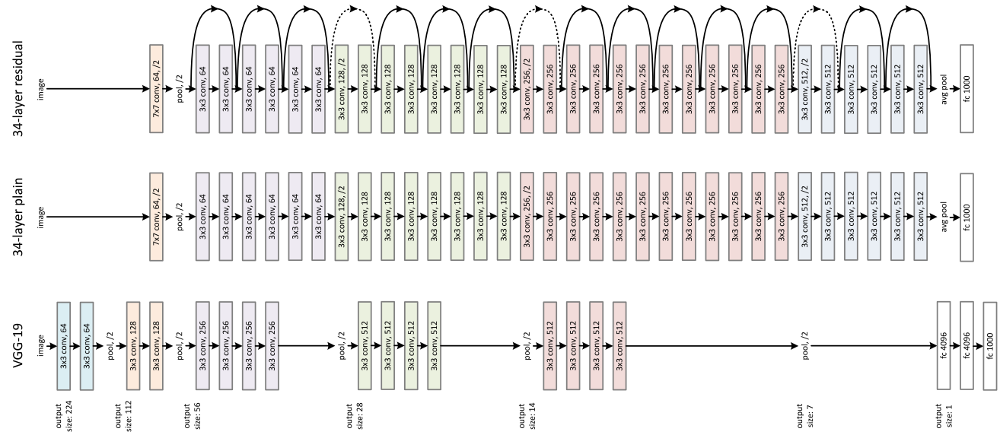

In [85]:
from IPython.display import Image, display

display(Image(filename="resnet.png"))

**resnet**s (top network in the above image) are a repeating structure made up of blocks that are sequentially stacked-up. In PyTorch, each such block is defined as a [`Bottleneck` object](https://github.com/pytorch/vision/blob/main/torchvision/models/resnet.py#L108):

```python
class Bottleneck(nn.Module):
    # Bottleneck in torchvision places the stride for downsampling at 3x3 convolution(self.conv2)
    # while original implementation places the stride at the first 1x1 convolution(self.conv1)
    # according to "Deep residual learning for image recognition" https://arxiv.org/abs/1512.03385.
    # This variant is also known as ResNet V1.5 and improves accuracy according to
    # https://ngc.nvidia.com/catalog/model-scripts/nvidia:resnet_50_v1_5_for_pytorch.

    expansion: int = 4

    def __init__(
        self,
        inplanes: int,
        planes: int,
        stride: int = 1,
        downsample: Optional[nn.Module] = None,
        groups: int = 1,
        base_width: int = 64,
        dilation: int = 1,
        norm_layer: Optional[Callable[..., nn.Module]] = None,
    ) -> None:
        super().__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        width = int(planes * (base_width / 64.0)) * groups
        # Both self.conv2 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv1x1(inplanes, width)
        self.bn1 = norm_layer(width)
        self.conv2 = conv3x3(width, width, stride, groups, dilation)
        self.bn2 = norm_layer(width)
        self.conv3 = conv1x1(width, planes * self.expansion)
        self.bn3 = norm_layer(planes * self.expansion)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x: Tensor) -> Tensor:
        identity = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)
        out = self.conv3(out)
        out = self.bn3(out)
        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)
        return out
```

Although we haven't covered all the components of the above pytorch snippet (e.g. CNNs), let's point out some small pieces of it. The constructor, `__init__`, basically initializes the **nn**, similarly to our `define_nn` function. And, similarly to our `forward` function, the `Bottleneck.forward` method specifies how the **nn** acts for a given input `x`. Now, if you initialize a bunch of `Bottleneck` blocks and stack them up serially, you get a **resnet**. Notice what is happening here. We have convolutional layers (e.g. `conv1x1`, `conv3x3`). These are the same thing as a linear layer, except that convolutional layers are used for images and so they have spatial structure. What this means is that the linear multiplication and bias offset (e.g. `logits = h @ w2 + b2`) are done on overlapping patches, or parts, of the input, instead on the full input (since the images have spatial structure). Otherwise though, convolutional layers basically do an `wx + b` type of operation. Then, we have a `norm` layer (e.g. `bn1`), which is initialized to be a 2D **batchnorm** layer (`BatchNorm2d`). And then, there is a `relu` non-linearity. We have used $tanh$ so far, but these are both common non-linearities that can be used relatively interchangeably. But for very deep networks, $ReLU$ typically and empirically works a bit better. And in the `Bottleneck.forward` method, you'll notice the following pattern: conv layer -> **batchnorm** layer -> relu, repeated three times. This however is basically almost exactly the same pattern employed in our `forward` function: linear layer -> **batchnorm** layer -> tanh. And that's the motif that you would be stacking up when you would be creating these deep **nn**s that are called **resnet**s. Now, if you dig deeper into the [PyTorch **resnet** implementation](https://github.com/pytorch/vision/blob/main/torchvision/models/resnet.py), you'll notice that in the functions that return a convolutional layer, e.g. `conv1x1`:

```python
def conv1x1(in_planes: int, out_planes: int, stride: int = 1) -> nn.Conv2d:
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)
```

## Interim summary

the bias is disabled (`bias=False`) for the exact same reason we deprecated the bias in our layer that precedes our **batchnorm** layer (like we said, keeping these parameters wouldn't hurt performance, but they are practically useless). So, because of the motif, the convolutional layers don't need a bias, as there is a bias in the following **barchnorm** layers to make up for them. Let's now also briefly descend into the definitions of similar pytorch layers and the parameters that they take. Instead of a convolutional layer, we're going to look at the [linear layer as implemented by PyTorch](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html). As we discussed, convolutional layers are basically linear ones except on patches of the image. So a linear layer performs a `wx + b` or $xA^T + b$ as described in the docs. And to initiliaze this `Linear` layer object, you need to know the fan-in (`in_features`) and the fan-out (`out_features`) in order to construct a weight matrix that has a shape $[in\_features \times out\_features]$. In our case, the equivalent parameters for the first layer are: `n_embd * block_size, n_hidden`. Also there is an option to enable or disable the bias. Furthermore, if you see the `Variables` section of the docs, there's a weight and a bias bulletpoint whose default initialization is described. So by default, PyTorch initializes the weights by taking the fan-in and then calculating the square root of $k = \frac{1}{in\_features}$. And then,  the weights are drawn from a $U(-\sqrt{k}, \sqrt{k})$ uniform distribution. Despite the lack of the `tanh` gain $5/3$ that we are using, this is the same kaiming initialization as we have described throughout this lesson. The reason is that if you have a roughly Gaussian input, a kaiming initialization will ensure that out of this layer (e.g. `Linear`) you will have a roughly Gaussian output. Let's now look at the [PyTorch `BatchNorm1D` **batchnorm** layer](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html). It takes a `num_features` argument (e.g. `n_hidden` in our case) in order to initialize the gain, bias and running parameters, as well as an $\epsilon$ parameter that is used for the square root of the normalization denominator. There is also a `momentum=0.1` parameter that is used in the calculation of the running mean and std values (our equivalent is $0.001$, e.g. `bnmean_running = 0.999 * bnmean_running + 0.001 * bnmean`) which you may want to change sometimes. Roughly speaking, if you have a very large batch size, typically what you'll see is that when you estimate the mean and std, for every single batch size, if it's large enough, you're going to get roughly the same result. And therefore, slightly higher momentum like the default $0.1$. However, for a batch size as small as $32$ (e.g. the one we use), the mean and std here might take on slightly different numbers, because there's *only* $32$ (instead of let's say $128$) to estimate the mean and std. So in that case, the $0.001$ in our example is more appropriate for convergence than the larger, potentially dangerous $0.1$ that would cause more thrashing and higher inaccuracies in the calculations. There's also the `affine` boolean parameter, that determines whether the **batchnorm** layer's gain and bias parameters are learnable, and the `track_running_stats` boolean parameter. One reason you may want to skip running stats is because you may want to, for example, calculate them after training, as a second stage (e.g. through `mean_and_std_over_trainset()`). And so in that case, you wouldn't want the **batchnorm** layer to do all this extra compute that you're not gonna use. Finally, you can also specify the `device` that the **batchnorm** layer pass is going to happen on (either `cpu` or `gpu`) and what the datatype is going to be (half-precision, single-precision, double-precision, and so on). So that is more or less the **batchnorm** layer covered in the paper, as implemented by us and as quite-similarly provided in PyTorch. And that's all we wanted to cover in this lecture: the importance of understanding the activations and the gradients and their statistics in **nn**s. And this becomes increasingly important especially as you make your **nn**s bigger, larger and deeper. We looked at the distributions at the output layer and we saw that if you have too confident mispredictions, because the activations are too messed up at the last layer, you can end up with these hockey stick losses. And if you fix this, you get a better loss at the end of training, because your training is not doing wasteful work. Then, we also saw that we need to control the activations as we don't want them to squash to zero or explode to the flat regions of the non-linearity's output range, because you can run into trouble (e.g. dead neurons). Basically, you want everything to be fairly homogeneous throughout the **nn**. You want roughly Gaussian activations throughout the **nn**. And then we pondered, if we want roughly Gaussian activations, how do we scale these weight matrices and biases during initialization of the **nn** so that everything is as controlled as possible. By a bit of trial and error, we found some appropriate scaling factors that gave us the uniform activations that we seeked. Of course, we realize that scaling parameters like that is very very hard and practically unsustainable a method when the **nn** is much much deeper. So then we introduced the notion of the normalization layer that people use in practice: **batchnorm**, layer normalization, instance normalization, group normalization. And we introduced and covered the one that came out first. **batchnorm** is layer that you can sprinkle throughout your deep **nn** and the basic idea is that if you want roughly Gaussian activations, well then take your activations, find their mean and std and center your data. And you can do that because the centering operation is differentiable. On top of that, we had to add a lot of bells and whistles, giving us a sense of the complexity of **batchnorm**. Because, ok now we're centering the data: that's great. But suddenly we need the gain and bias parameters and now those are trainable. And because we are coupling all the training examples, the questioning is how do you do the inference? To do the inference, we then realized that we have to estimate the mean and std once on the entire training set and then use those at inference. But then, no one likes to do that as a second stage after training. So calculate those values as running averages during training and estimate these in a running manner so that everything is a bit simpler. And again! That was the **batchnorm** layer. Last time, I promise. Lol. Although helpful, no one likes this layer! It causes a huge amount of bugs and intuitively that's because it's coupling different examples (per batch) in the forward pass of a **nn**. And many have shot themselves in the foot with this layer, over and over again in their lifetimes. So, in order to avoid sufferring, try to avoid it as much as possible (e.g. by using other normalization alternatives). Nevertheless, **batchnorm** proven to be very influential when it came out in 2015 because that was the first time that you could train reliably much deeper **nn**s. The reason for that is that this layer is very effective at controlling the statistics of the activations in a **nn**. Now, that's all for now. In the next notebooks, we can start going fully into recurrent **nn**s which are very very deep networks (due to unrolling during optimization). And that is where a lot of this analysis around the activation statistics and all these normalization layers will become very very important for good performance. So, we'll see that next time. Bye!

## **torch**ification

**Just kidding!** - As a bonus, before the next lesson, we will cover one more summary of everything we have presented in this lesson so far. But also, it would be very useful to "torchify" our code a little bit so it looks much more like what you would encounter in PyTorch. We will structure our code into modules. Then we will construct our **nn** like we would in PyTorch and we will run our training loop to optimize it. Then, as one last thing we will visualize the activation statistics both in the forward pass and in the backward pass, before evaluating and sampling just like we have done before. Let's start. Similar to [torch.nn.Linear](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html), we will implement our own linear layer. By default, we initialize the weights by drawing numbers from a Gaussian distribution and doing a kaiming initialization and we initialize the bias to zero. When calling this module, we do a forward pass and calculate `x @ w + b`, whereas calling a `parameters` method will return the weight and bias tensors of this layer. 

In [86]:
class Linear:
    def __init__(self, fan_in, fan_out, generator, bias=True):
        self.weight = torch.randn((fan_in, fan_out), generator=generator) / fan_in**0.5
        self.bias = torch.zeros(fan_out) if bias else None

    def __call__(self, x):
        self.out = x @ self.weight
        if self.bias is not None:
            self.out += self.bias
        return self.out

    def parameters(self):
        return [self.weight] + ([] if self.bias is None else [self.bias])

Similar to the [PyTorch `BatchNorm1D` **batchnorm** layer](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html), we will define our own. Apart from the parameters we discussed previously (`dim`, `eps`, `momentum`), we will also define the `training` attribute. When this boolean flag is enabled, the running mean values are calculated (training mode) and when it is disabled, they are not (testing mode). When calling this layer, we do a forward pass, wherein mean values are assigned and an output value is calculated (as described previously) and saved (in order to comfortably plot them later on) and finally we update the moving average buffers. Notice the `torch.no_grad()` context manager we use in order to make our code more efficient by bypassing unnecessary saving into a maintained computation graph (since we do not care about gradients for the buffer variables, there is no point in wasting memory for the allocation of gradient-related data). This context manager essentially signifies that we will not be calling `backward` on the variables inside it.

In [87]:
class BatchNorm1d:
    def __init__(self, dim, eps=1e-5, momentum=0.1):
        self.eps = eps
        self.momentum = momentum
        self.training = True
        # parameters (trained with backprop)
        self.gamma = torch.ones(dim)
        self.beta = torch.zeros(dim)
        # buffers (trained with a running 'momentum update')
        self.running_mean = torch.zeros(dim)
        self.running_var = torch.ones(dim)

    def __call__(self, x):
        # calculate the forward pass
        if self.training:
            xmean = x.mean(0, keepdim=True)  # batch mean
            xvar = x.var(0, keepdim=True)  # batch variance
        else:
            xmean = self.running_mean
            xvar = self.running_var
        xhat = (x - xmean) / torch.sqrt(xvar + self.eps)  # normalize to unit variance
        self.out = self.gamma * xhat + self.beta
        # update the buffers
        if self.training:
            with torch.no_grad():
                self.running_mean = (
                    1 - self.momentum
                ) * self.running_mean + self.momentum * xmean
                self.running_var = (
                    1 - self.momentum
                ) * self.running_var + self.momentum * xvar
        return self.out

    def parameters(self):
        return [self.gamma, self.beta]

Lastly, in PyTorch fashion, we also calculate an equivalent [torch.nn.Tanh](https://pytorch.org/docs/stable/generated/torch.nn.Tanh.html) layer:

In [88]:
class Tanh:
    def __call__(self, x):
        self.out = torch.tanh(x)
        return self.out

    def parameters(self):
        return []

So, by defining everything in layers it now becomes very easy to stack them up into a list and more intuitively "define" any **nn**. Let's see how by updating our `define_nn()`:

In [89]:
def define_nn(
    n_embd=10,
    hidden_dims=[100, 100, 100, 100, 100],
    weight_gain=5 / 3,
    batchnorm_enabled=False,
    add_batchnorm_last_layer=False,
    tanh_enabled=True,
):
    global C, g
    g = torch.Generator().manual_seed(SEED)
    C = torch.randn((vocab_size, n_embd), generator=g)
    input_size = n_embd * block_size
    output_size = vocab_size
    # define input layer
    layers = [
        Linear(input_size, hidden_dims[0], generator=g, bias=False),
    ]
    if batchnorm_enabled:
        layers.append(BatchNorm1d(hidden_dims[0]))
    if tanh_enabled:
        layers.append(Tanh())
    # define hidden layers
    for i, n_hidden in enumerate(hidden_dims[:-1]):
        layers.append(Linear(n_hidden, hidden_dims[i + 1], generator=g, bias=False))
        if batchnorm_enabled:
            layers.append(BatchNorm1d(n_hidden))
        if tanh_enabled:
            layers.append(Tanh())
    # define output layer
    layers.append(Linear(hidden_dims[-1], output_size, generator=g, bias=False))
    if add_batchnorm_last_layer:
        layers.append(BatchNorm1d(output_size))
    # scale parameters
    with torch.no_grad():
        # last layer: make less confident
        if add_batchnorm_last_layer:
            layers[-1].gamma *= 0.1
        else:
            layers[-1].weight *= 0.1
        # all other layers: apply gain
        for layer in layers[:-1]:
            if isinstance(layer, Linear):
                layer.weight *= weight_gain
    # collect parameters
    parameters = [C] + [p for layer in layers for p in layer.parameters()]
    print(sum(p.nelement() for p in parameters))  # number of parameters in total
    for p in parameters:
        p.requires_grad = True
    return layers, parameters

Now let's update the our `forward`, `backward` and `train` functions:

In [90]:
def forward(layers, xb, yb):
    emb = C[xb]  # embed the characters into vectors
    x = emb.view(emb.shape[0], -1)  # concatenate the vectors
    for layer in layers:
        x = layer(x)
    loss = F.cross_entropy(x, yb)  # loss function
    return loss

In [91]:
def backward(layers, parameters, loss, debug=False):
    if debug:
        for layer in layers:
            layer.out.retain_grad()
    for p in parameters:
        p.grad = None
    loss.backward()

In [92]:
def train(
    x,
    y,
    layers,
    parameters,
    initial_lr=0.1,
    maxsteps=200000,
    batchsize=32,
    break_at_step=None,
):
    lossi = []
    for i in range(maxsteps):
        # minibatch construct
        bix = torch.randint(0, x.shape[0], (batchsize,))
        xb, yb = x[bix], y[bix]
        loss = forward(layers, xb, yb)
        backward(layers, parameters, loss, debug=(break_at_step is not None))
        lr = initial_lr if i < 150000 else initial_lr / 10
        update(parameters, lr=lr)
        # track stats
        if i % 10000 == 0:  # print every once in a while
            print(f"{i:7d}/{maxsteps:7d}: {loss.item():.4f}")
        lossi.append(loss.log10().item())
        if break_at_step is not None and i >= break_at_step:
            break  # AFTER_DEBUG: would take out obviously to run full optimization
    return lossi

Now, we'll define a new **nn** and train in debug mode, for only one step.

In [93]:
layers, parameters = define_nn()
lossi = train(xtrain, ytrain, layers, parameters, break_at_step=0)

45970
      0/ 200000: 3.2798


## Visualizing activations and gradients

Now, since we defined an `out` attribute in our custom `Tanh` layer, after training we have saved the activations which we can visualize! Specifically, we will plot the histogram of each layer's $tanh$ activations.

In [94]:
def visualize_layer_values(layers, grad=False, layer_cls=Tanh):
    plt.figure(figsize=(20, 4))  # width and height of the plot
    legends = []
    for i, layer in enumerate(layers[:-1]):  # note: exclude the output layer
        if isinstance(layer, layer_cls):
            t = layer.out.grad if grad else layer.out
            if grad:
                print(
                    "layer %d (%10s): mean %+f, std %e"
                    % (i, layer.__class__.__name__, t.mean(), t.std())
                )
            else:
                print(
                    "layer %d (%10s): mean %+.2f, std %.2f, saturated: %.2f%%"
                    % (
                        i,
                        layer.__class__.__name__,
                        t.mean(),
                        t.std(),
                        (t.abs() > 0.97).float().mean() * 100,
                    )
                )
            hy, hx = torch.histogram(t, density=True)
            plt.plot(hx[:-1].detach(), hy.detach())
            legends.append(f"layer {i} ({layer.__class__.__name__}")
    plt.legend(legends)
    if grad:
        plt.title("gradient distribution")
    else:
        plt.title("activation distribution")

layer 1 (      Tanh): mean -0.03, std 0.76, saturated: 20.94%
layer 3 (      Tanh): mean -0.04, std 0.69, saturated: 9.09%
layer 5 (      Tanh): mean +0.01, std 0.68, saturated: 8.12%
layer 7 (      Tanh): mean +0.01, std 0.65, saturated: 5.59%
layer 9 (      Tanh): mean -0.02, std 0.65, saturated: 5.91%


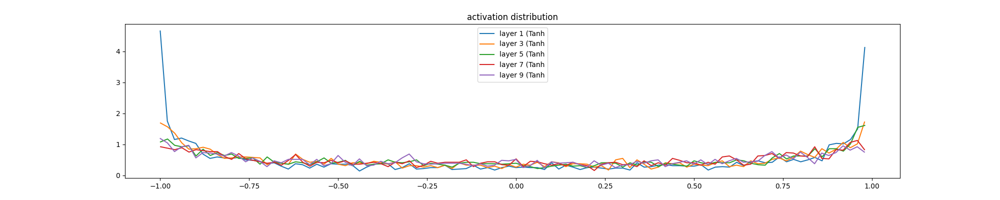

In [95]:
visualize_layer_values(layers)

This histogram shows us how many values in these tensors take on any of the values on the x-axis. layer $1$ is fairly saturated (~20%), with a significant amount of values being close to the saturation points at the tails ($-1$, $+1$) and the subsequent layers being more stable. And why the values are pretty stable is because the weight values of the `Linear` layer are boosted by a gain of $5/3$. If we use a gain of $1$ (aka no gain), let's see what happens:

45970
      0/ 200000: 3.2930
layer 1 (      Tanh): mean -0.06, std 0.62, saturated: 3.25%
layer 3 (      Tanh): mean -0.00, std 0.47, saturated: 0.06%
layer 5 (      Tanh): mean +0.01, std 0.41, saturated: 0.00%
layer 7 (      Tanh): mean -0.01, std 0.35, saturated: 0.00%
layer 9 (      Tanh): mean -0.01, std 0.32, saturated: 0.00%


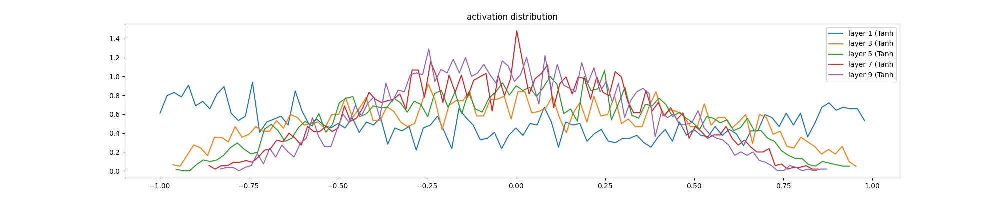

In [96]:
layers, parameters = define_nn(weight_gain=1)
lossi = train(xtrain, ytrain, layers, parameters, break_at_step=0)
visualize_layer_values(layers)

Now, from the first to the last $tanh$ layer, the std shrinks and the saturation goes to $0$. What this means is that the activations are being shrunk to $0$. The reason for that is that when you just have a sandwich of linear layer, $tanh$ layer pairs, these $tanh$ layers act as squashing functions that take a distribution and slightly squeeze it towards zero. Therefore, some gain is necessary in order to keep expanding the distributions and by doing so to fight the squashing phenomenon. So, if the gain is close to $1$, the activations will then come towards $0$, but if it is something too big (such as $3$), then, on the contrary, the saturations end up way too large:

45970
      0/ 200000: 3.3157
layer 1 (      Tanh): mean -0.07, std 0.85, saturated: 46.59%
layer 3 (      Tanh): mean +0.00, std 0.84, saturated: 40.69%
layer 5 (      Tanh): mean +0.02, std 0.85, saturated: 44.00%
layer 7 (      Tanh): mean -0.01, std 0.83, saturated: 40.69%
layer 9 (      Tanh): mean -0.01, std 0.84, saturated: 39.41%


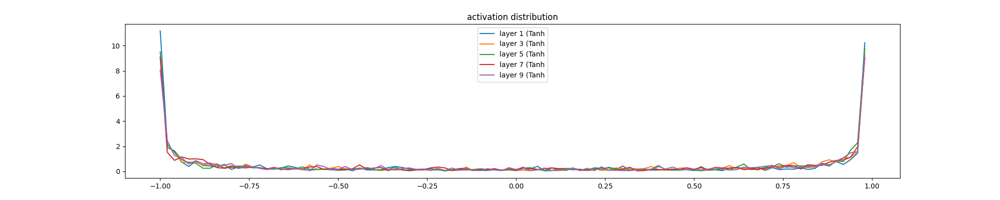

In [97]:
layers, parameters = define_nn(weight_gain=3)
lossi = train(xtrain, ytrain, layers, parameters, break_at_step=0)
visualize_layer_values(layers)

So, $5/3$ (the default value) is a good setting for a sandwich of linear layers with $tanh$ activations. And it roughly stabilizes the std at a reasonable value (~5%), which is a pretty good number and this is a good setting of the gain in this context:

45970
      0/ 200000: 3.3002
layer 1 (      Tanh): mean -0.05, std 0.74, saturated: 17.25%
layer 3 (      Tanh): mean +0.00, std 0.69, saturated: 8.09%
layer 5 (      Tanh): mean +0.00, std 0.68, saturated: 7.84%
layer 7 (      Tanh): mean -0.02, std 0.65, saturated: 5.94%
layer 9 (      Tanh): mean -0.00, std 0.66, saturated: 6.00%


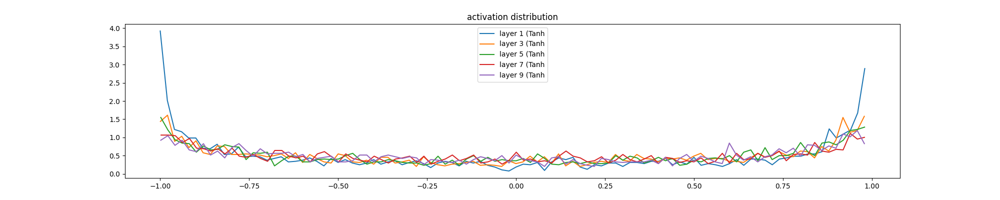

In [98]:
layers, parameters = define_nn()
lossi = train(xtrain, ytrain, layers, parameters, break_at_step=0)
visualize_layer_values(layers)

Similarly, we can do the exact same thing with the gradients. So, here we will run the exact same loop by using the exact same function, but instead of the layer outputs we will now visualize the gradients (`.grad`):

45970
      0/ 200000: 3.2927
layer 1 (      Tanh): mean +0.000008, std 3.873240e-04
layer 3 (      Tanh): mean +0.000001, std 3.706014e-04
layer 5 (      Tanh): mean +0.000014, std 3.513209e-04
layer 7 (      Tanh): mean -0.000003, std 3.159422e-04
layer 9 (      Tanh): mean +0.000001, std 2.955447e-04


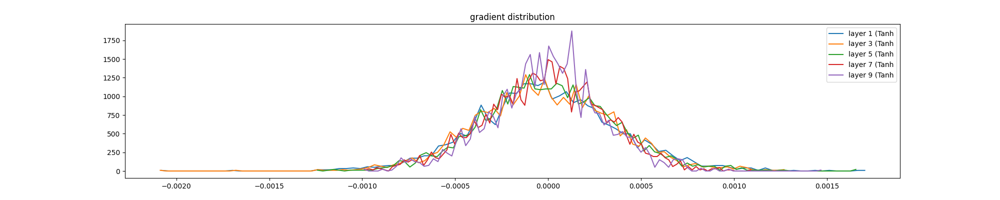

In [99]:
layers, parameters = define_nn()
lossi = train(xtrain, ytrain, layers, parameters, break_at_step=0)
visualize_layer_values(layers, grad=True)

Here, you will see that the gradient distribution is fairly reasonable. And in particular, what we are looking for is that all of these layers (layer $1$, $2$, etc.) in this "sandwich" have roughly the same gradient. Things are not shrinking or exploding. So, let's train and set the gain as way too small, $0.5$ and see what happens to the activations and the gradients:

45970
      0/ 200000: 3.2954
layer 1 (      Tanh): mean -0.05, std 0.41, saturated: 0.00%
layer 3 (      Tanh): mean -0.00, std 0.19, saturated: 0.00%
layer 5 (      Tanh): mean +0.00, std 0.10, saturated: 0.00%
layer 7 (      Tanh): mean +0.00, std 0.05, saturated: 0.00%
layer 9 (      Tanh): mean -0.00, std 0.02, saturated: 0.00%
layer 1 (      Tanh): mean +0.000000, std 1.913021e-05
layer 3 (      Tanh): mean -0.000001, std 3.979003e-05
layer 5 (      Tanh): mean +0.000003, std 8.041871e-05
layer 7 (      Tanh): mean +0.000004, std 1.558925e-04
layer 9 (      Tanh): mean -0.000007, std 3.047277e-04


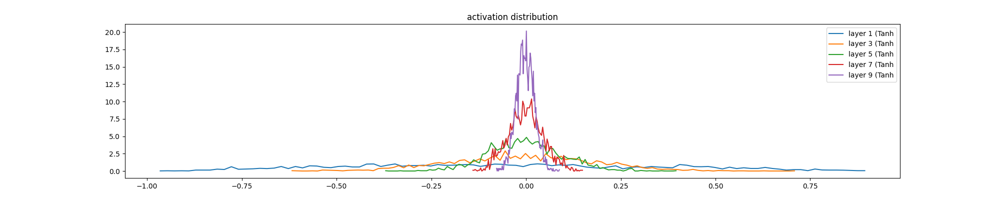

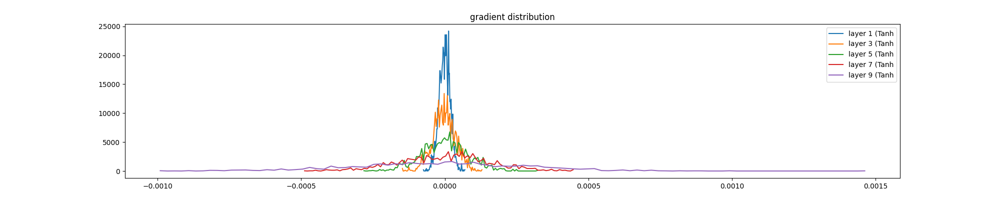

In [100]:
layers, parameters = define_nn(weight_gain=0.5)
lossi = train(xtrain, ytrain, layers, parameters, break_at_step=0)
visualize_layer_values(layers)
visualize_layer_values(layers, grad=True)

First of all, now, the activations are shrinking to zero but also the gradients are doing something weird: they start off very narrow, around $0.0$ (see layer $1$), but then in layers that follow, they are expanding out (layer 3, 5, etc.). If we now use a too-high of a gain, e.g. $3.0$, like we did before:

45970
      0/ 200000: 3.2952
layer 1 (      Tanh): mean +0.000014, std 9.988851e-04
layer 3 (      Tanh): mean -0.000020, std 7.431745e-04
layer 5 (      Tanh): mean +0.000014, std 5.489704e-04
layer 7 (      Tanh): mean -0.000012, std 4.008604e-04
layer 9 (      Tanh): mean -0.000006, std 2.981189e-04


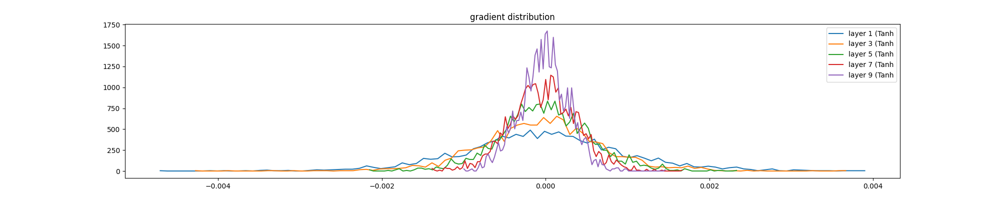

In [101]:
layers, parameters = define_nn(weight_gain=3.0)
lossi = train(xtrain, ytrain, layers, parameters, break_at_step=0)
visualize_layer_values(layers, grad=True)

then we see that for the gradients there is some asymmetry going on where, as you go into deeper and deeper layers, the activations are also changing. Therefore, we have to very carefully set the grains to get nice activations in both the forward and backard passes. Now, before we move on to **batchnorm**, let's see what happens with the activations when we remove the `Tanh` units and thus only a giant linear sandwich remains as our **nn**:

45970
      0/ 200000: 3.8707
layer 0 (    Linear): mean -0.08, std 1.62, saturated: 54.84%
layer 1 (    Linear): mean -0.03, std 2.64, saturated: 68.88%
layer 2 (    Linear): mean +0.08, std 4.41, saturated: 80.94%
layer 3 (    Linear): mean +0.11, std 7.11, saturated: 89.00%
layer 4 (    Linear): mean -0.54, std 11.83, saturated: 92.28%


/tmp/ipykernel_3323983/3179552959.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20, 4))  # width and height of the plot


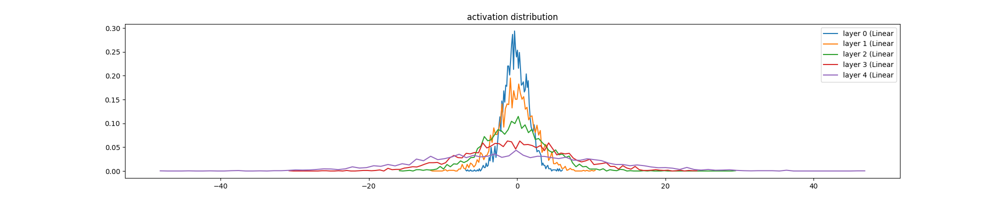

In [102]:
layers, parameters = define_nn(tanh_enabled=False)
lossi = train(xtrain, ytrain, layers, parameters, break_at_step=0)
visualize_layer_values(layers, layer_cls=Linear)

What we are seeing is that the activations started out on the blue (layer $1$) and by layer 4 they have become very diffuse, so what is happening to the activations is that they are expanding.

layer 0 (    Linear): mean +0.000034, std 2.515831e-03
layer 1 (    Linear): mean -0.000020, std 1.538157e-03
layer 2 (    Linear): mean +0.000068, std 9.242766e-04
layer 3 (    Linear): mean +0.000002, std 5.347828e-04
layer 4 (    Linear): mean -0.000009, std 3.113869e-04


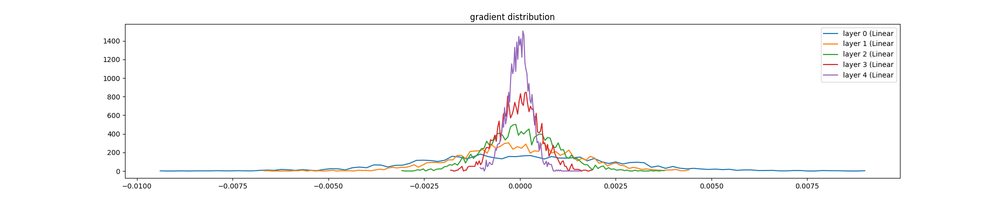

In [103]:
visualize_layer_values(layers, grad=True, layer_cls=Linear)

Conversely, the gradients follow the opposite pattern, as you go down deeper in the layers. So basically you have an asymmetry in the **nn**. And you might imagine that if you have very deep **nn**s, say like 50 layers or something like that, the above pattern is not a good place to be! That's why before the **batchnorm** technique, the grain was incredibly tricky to set. See what happens, for a very small gain:

45970
      0/ 200000: 3.2960
layer 0 (    Linear): mean -0.04, std 0.50, saturated: 5.62%
layer 1 (    Linear): mean +0.00, std 0.25, saturated: 0.00%
layer 2 (    Linear): mean +0.00, std 0.13, saturated: 0.00%
layer 3 (    Linear): mean +0.00, std 0.06, saturated: 0.00%
layer 4 (    Linear): mean -0.00, std 0.03, saturated: 0.00%
layer 0 (    Linear): mean +0.000000, std 1.966490e-05
layer 1 (    Linear): mean +0.000001, std 3.992750e-05
layer 2 (    Linear): mean +0.000002, std 7.989314e-05
layer 3 (    Linear): mean +0.000005, std 1.559324e-04
layer 4 (    Linear): mean -0.000004, std 3.064860e-04


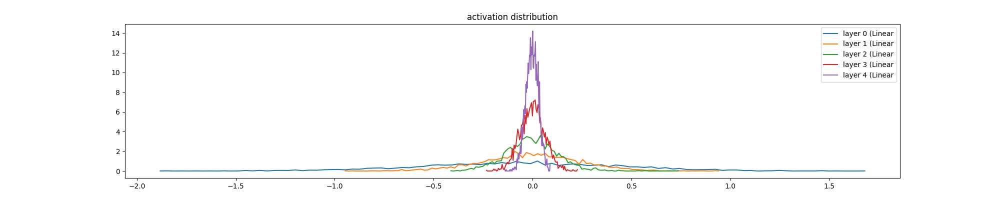

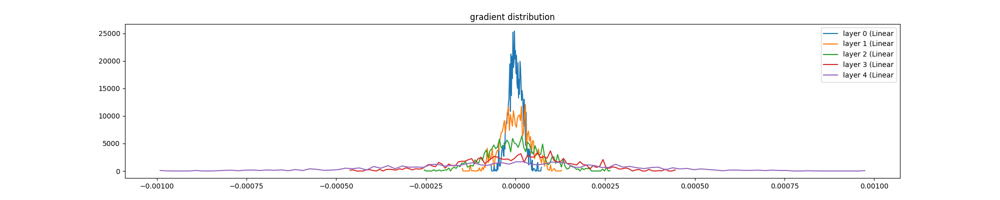

In [104]:
layers, parameters = define_nn(tanh_enabled=False, weight_gain=0.5)
lossi = train(xtrain, ytrain, layers, parameters, break_at_step=0)
visualize_layer_values(layers, layer_cls=Linear)
visualize_layer_values(layers, grad=True, layer_cls=Linear)

Basically, the reverse occurs: activations shrink and gradients diffuse, as we go deeper in the layers. Therefore, certainly these patterns are not what we would want and in this case the correct setting of the gain is exactly $1.0$, just as we are doing at initialization:

45970
      0/ 200000: 3.3058
layer 0 (    Linear): mean -0.06, std 1.02, saturated: 33.66%
layer 1 (    Linear): mean -0.02, std 1.00, saturated: 31.81%
layer 2 (    Linear): mean +0.02, std 1.05, saturated: 34.62%
layer 3 (    Linear): mean +0.02, std 0.99, saturated: 32.47%
layer 4 (    Linear): mean -0.06, std 1.00, saturated: 32.38%
layer 0 (    Linear): mean +0.000004, std 3.331996e-04
layer 1 (    Linear): mean +0.000007, std 3.292507e-04
layer 2 (    Linear): mean +0.000010, std 3.296380e-04
layer 3 (    Linear): mean +0.000005, std 3.163717e-04
layer 4 (    Linear): mean -0.000009, std 3.038179e-04


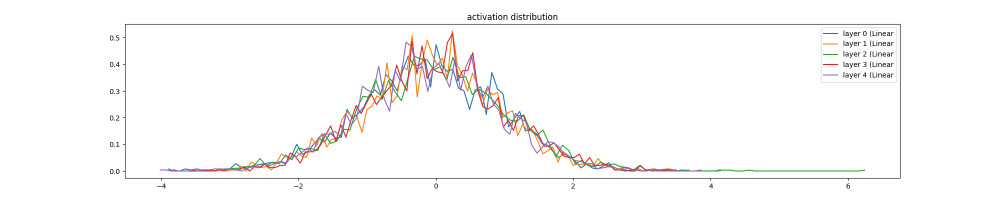

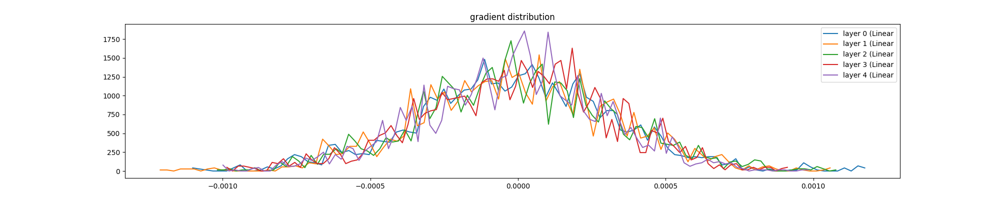

In [105]:
layers, parameters = define_nn(tanh_enabled=False, weight_gain=1.0)
lossi = train(xtrain, ytrain, layers, parameters, break_at_step=0)
visualize_layer_values(layers, layer_cls=Linear)
visualize_layer_values(layers, grad=True, layer_cls=Linear)

Now we see that the statistics for the forward and backward passes are well behaved! And so the reason we are demonstrating these phenomena is to highlight how getting **nn**s to train before these normalization layers and before the use of advanced optimizers like `Adam` (which we still have to cover) and residual connections and so on, training **nn**s basically looked like this:

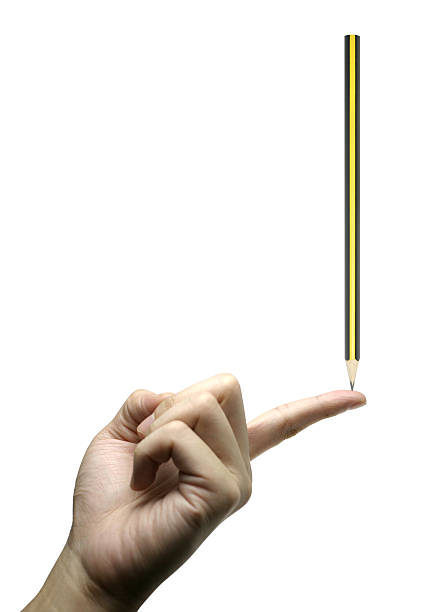

In [106]:
from IPython.display import Image, display

display(Image(filename="pencil_balancing.jpeg"))

Haha, like a total balancing act. You have to make sure that everything is precisely orchestrated and have to care about the activations and the gradients and the statistics and then maybe you can train something. But, it was basically impossible to train very deep networks, and this was fundamentally the reason for that. You would have to be very very careful with your initialization. The other point to make here is the question: why do we need $tanh$ layers at all? Why do we include them and then have to worry about the gain? The reason for that of course is that if you just have a stack of linear layers, then certainly we are very easily getting nice activations and so on but this is just a massive linear sandwich. And it turns out that it collapses to a single linear layer in terms of its representation power. So, if you were to plot the output as a function of the input, in that case, you are just getting a linear function. No matter how many linear layers you stack up, you still end up with just a linear transformation: all the sets of $wx + b$ just collapse into a large $WX + B$ with a slightly different weight and bias matrix. Interestingly though, even though in that case, the forward pass collapses to just a linear layer, because of **backprop** and the dynamics of the backward pass, the optimization is really not identical. You actually end up with all kinds of interesting dynamics in the backward pass because of the way the chain rule is calculating it. And so optimizing a linear layer by itself and optimizing a sandwich of 10 linear layer, in both cases, those are just a linear transformation in the forward pass, but the training dynamics would be different. And there are actually in fact entire papers that analyze infinitely layered linear layers, etc. and so as you can imagine there's a lot of things too that you can play with there. Basically, the `Tanh` non-linearities allow us to turn this sandwich from just a linear transformation into a **nn** that can in priciple approximate any arbitrary function.

## Further visualization

Now, we'll define a **nn** with **batchnorm** layers between the linear and $tanh$ layers and we will look at another kind of visualization that is very important to consider when training **nn**s:

In [107]:
def visualize_weight_gradients(parameters):
    plt.figure(figsize=(20, 4))  # width and height of the plot
    legends = []
    for i, p in enumerate(parameters):
        t = p.grad
        if p.ndim == 2:
            print(
                "weight %10s | mean %+f | std %e | grad:data ratio %e"
                % (tuple(p.shape), t.mean(), t.std(), t.std() / p.std())
            )
            hy, hx = torch.histogram(t, density=True)
            plt.plot(hx[:-1].detach(), hy.detach())
            legends.append(f"{i} {tuple(p.shape)}")
    plt.legend(legends)
    plt.title("weights gradient distribution")

46970
      0/ 200000: 3.2943
weight   (27, 10) | mean -0.000000 | std 1.098550e-03 | grad:data ratio 1.097755e-03
weight  (30, 100) | mean +0.000001 | std 1.092446e-03 | grad:data ratio 3.502961e-03
weight (100, 100) | mean -0.000001 | std 1.001677e-03 | grad:data ratio 6.029822e-03
weight (100, 100) | mean -0.000002 | std 9.073025e-04 | grad:data ratio 5.404340e-03
weight (100, 100) | mean +0.000009 | std 8.231274e-04 | grad:data ratio 4.923555e-03
weight (100, 100) | mean -0.000012 | std 7.294616e-04 | grad:data ratio 4.359063e-03
weight  (100, 27) | mean +0.000000 | std 2.092700e-02 | grad:data ratio 2.070950e+00


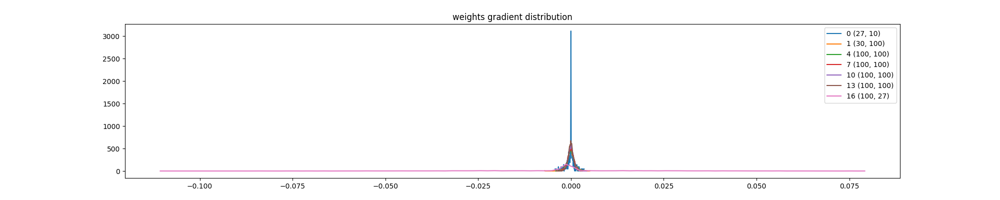

In [108]:
layers, parameters = define_nn(batchnorm_enabled=True)
lossi = train(xtrain, ytrain, layers, parameters, break_at_step=0)
visualize_weight_gradients(parameters)

So, ultimately what we are doing during training is that we are updating the parameters of the **nn**. So, we care about the parameters, their values and their gradients. Therefore, in `visualize_weight_gradients` what we are doing is we are iterating over all the available parameters and then we are only considering the 2-dimensional ones (by checking `if p.ndim == 2`), which are basically the weights of these linear layers. We are skipping the biases, the gammas and the betas in the **batchnorm** layer just for simplicity, because what is happening with the weights is instructive by itself. Here, we have printed the mean, std and gradient-to-data ratio, which is helpful for getting a sense of the scale of the gradient compared to the scale of the actual values. This is important because we are going to be taking a step update that is the learning rate times the gradient onto the data. And so if the gradient has too large of a magnitude (if the numbers in that tensor are too large) compared to the data (the numbers in the data tensor), then you are in trouble. But in our case, our grad-to-data ratios are low numbers (e.g. `1.209762e-03`) and the grad values are $100$ to $1000$ times smaller than the data values of these weight parameters. Notably, this is not true about the last layer ($16$, pink) which is a bit of a troublemaker in the way that it is currently arranged. Because you can see that this layer takes on values that are much larger than some of the other layer's values inside the **nn**. And so the std values are roughly $10^{-3}$ throughout the layers, except for the last linear layer that has an std of roughly $10^{-2}$. That is problematic, because in the simple stochastic gradient descent setup, you would be training the last layer about $10$ times faster than you would be training the other layers at initialization. Now this actually fixes itself a little bit if you train for a bit longer. So, for example if we stop the training at step $1000$ and plot the distributions:

45970
      0/ 200000: 3.3076
layer 1 (      Tanh): mean -0.02, std 0.77, saturated: 21.56%
layer 3 (      Tanh): mean -0.02, std 0.72, saturated: 11.81%
layer 5 (      Tanh): mean +0.00, std 0.74, saturated: 13.53%
layer 7 (      Tanh): mean -0.04, std 0.73, saturated: 10.53%
layer 9 (      Tanh): mean +0.02, std 0.72, saturated: 10.81%


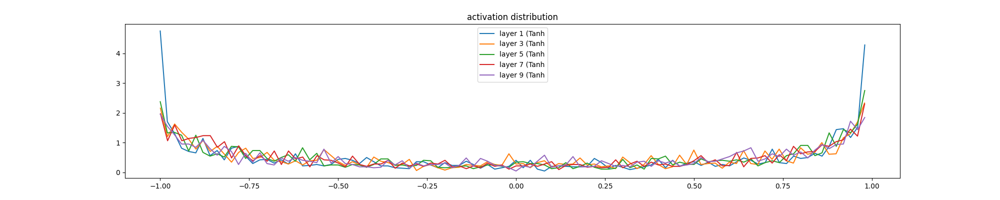

In [109]:
layers, parameters = define_nn()
lossi = train(xtrain, ytrain, layers, parameters, break_at_step=1000)
visualize_layer_values(layers)

Here we see how in the forward pass the neurons are saturating just a bit (~21% for layer 1, ~11% for layers 2+).

layer 1 (      Tanh): mean +0.000058, std 3.400338e-03
layer 3 (      Tanh): mean +0.000051, std 3.191254e-03
layer 5 (      Tanh): mean -0.000008, std 3.090064e-03
layer 7 (      Tanh): mean -0.000059, std 2.879301e-03
layer 9 (      Tanh): mean +0.000011, std 2.456611e-03


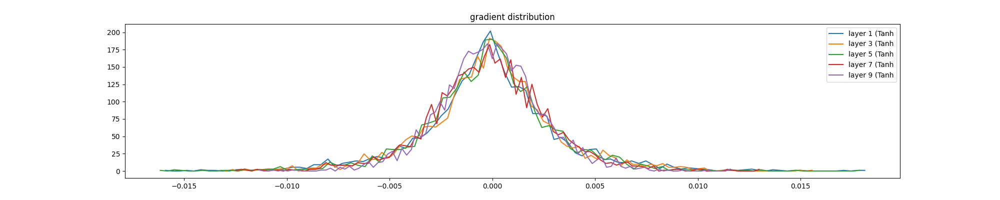

In [110]:
visualize_layer_values(layers, grad=True)

And if we also look at the backward pass, the stds are more or less equal and there is no shrinking to $0$ or exploding to $\infty$.

weight   (27, 10) | mean +0.001915 | std 1.059104e-02 | grad:data ratio 1.058037e-02
weight  (30, 100) | mean -0.000068 | std 1.023695e-02 | grad:data ratio 3.268883e-02
weight (100, 100) | mean +0.000124 | std 7.943954e-03 | grad:data ratio 4.720122e-02
weight (100, 100) | mean +0.000014 | std 7.041695e-03 | grad:data ratio 4.145475e-02
weight (100, 100) | mean +0.000016 | std 7.003058e-03 | grad:data ratio 4.147651e-02
weight (100, 100) | mean -0.000042 | std 6.102301e-03 | grad:data ratio 3.620835e-02
weight  (100, 27) | mean +0.000000 | std 2.352006e-02 | grad:data ratio 3.274958e-01


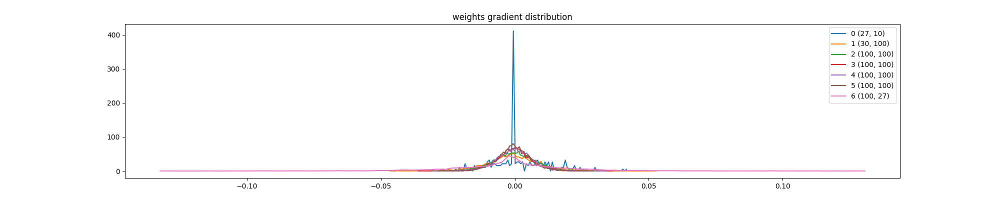

In [111]:
visualize_weight_gradients(parameters)

And last but not least, you can see here, in the weight gradients, things are also stabilizing a little bit. So the tails of the last layer ($6$, pink) are being drawn to $0$ during the optimization. But this is certainly a little bit troubling. Especially if you are using a very simple update rule like stochastic gradient descent, instead of a modern optimizer like Adam. Now, let's look at another plot that is very useful to look at when training **nn**s. First of all, let's agree that the grad-to-data ratio is actually not that informative because what matters at the end instead is actually the update-to-data ratio. Because that is the amount by which we will actually change the data in these tensors. So, now let's update the `train` function by introducing a new update-to-data ratio list (`ud`) that we are going to be building up for every single training iteration in order to keep track of this ratio:

In [112]:
def train(
    x,
    y,
    layers,
    parameters,
    initial_lr=0.1,
    maxsteps=200000,
    batchsize=32,
    break_at_step=None,
):
    lossi = []
    ud = []
    for i in range(maxsteps):
        # minibatch construct
        bix = torch.randint(0, x.shape[0], (batchsize,))
        xb, yb = x[bix], y[bix]
        loss = forward(layers, xb, yb)
        backward(layers, parameters, loss, debug=(break_at_step is not None))
        lr = initial_lr if i < 150000 else initial_lr / 10
        update(parameters, lr=lr)
        # track stats
        if i % 10000 == 0:  # print every once in a while
            print(f"{i:7d}/{maxsteps:7d}: {loss.item():.4f}")
        lossi.append(loss.log10().item())
        with torch.no_grad():
            ud.append(
                [
                    ((lr * p.grad).std() / p.data.std()).log10().item()
                    for p in parameters
                ]
            )
        if break_at_step is not None and i >= break_at_step:
            break  # AFTER_DEBUG: would take out obviously to run full optimization
    return lossi, ud

Now, let's initialize a new **nn** and train for $1000$ iterations:

In [113]:
layers, parameters = define_nn()
lossi, ud = train(xtrain, ytrain, layers, parameters, break_at_step=1000)

45970
      0/ 200000: 3.3153


And look at the activations, the gradients and the weight gradients:

layer 1 (      Tanh): mean -0.06, std 0.77, saturated: 22.59%
layer 3 (      Tanh): mean -0.02, std 0.72, saturated: 12.34%
layer 5 (      Tanh): mean -0.01, std 0.74, saturated: 12.66%
layer 7 (      Tanh): mean -0.05, std 0.73, saturated: 12.59%
layer 9 (      Tanh): mean -0.01, std 0.72, saturated: 12.38%
layer 1 (      Tanh): mean -0.000043, std 3.569505e-03
layer 3 (      Tanh): mean -0.000023, std 3.266591e-03
layer 5 (      Tanh): mean -0.000063, std 3.074555e-03
layer 7 (      Tanh): mean +0.000045, std 3.062805e-03
layer 9 (      Tanh): mean -0.000024, std 2.393972e-03
weight   (27, 10) | mean -0.001415 | std 1.195363e-02 | grad:data ratio 1.194713e-02
weight  (30, 100) | mean +0.000113 | std 1.044533e-02 | grad:data ratio 3.337289e-02
weight (100, 100) | mean +0.000056 | std 8.070047e-03 | grad:data ratio 4.794424e-02
weight (100, 100) | mean +0.000003 | std 6.960700e-03 | grad:data ratio 4.100994e-02
weight (100, 100) | mean -0.000045 | std 6.889358e-03 | grad:data ratio 4.0

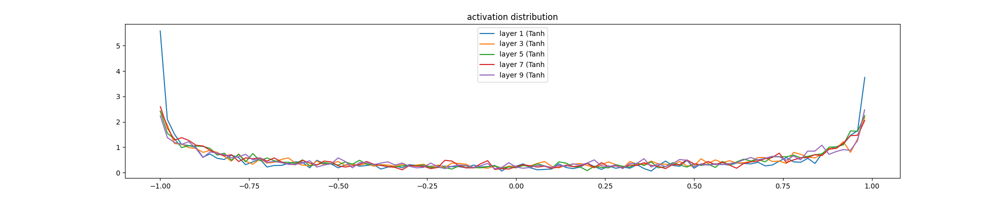

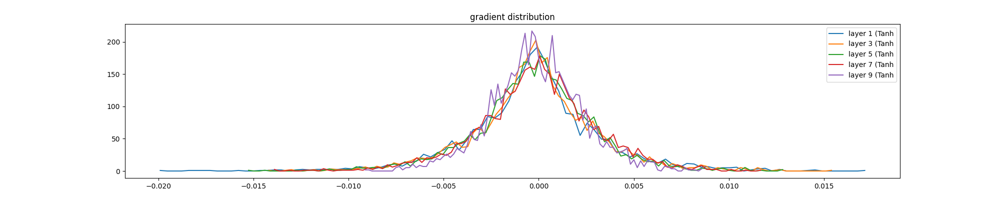

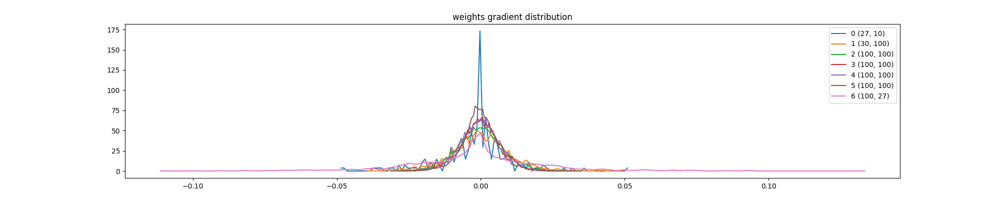

In [114]:
visualize_layer_values(layers)
visualize_layer_values(layers, grad=True)
visualize_weight_gradients(parameters)

but also one more plot we will now introduce:

In [115]:
def visualize_update_ratios(parameters, ud):
    plt.figure(figsize=(20, 4))
    legends = []
    for i, p in enumerate(parameters):
        if p.ndim == 2:
            plt.plot([ud[j][i] for j in range(len(ud))])
            legends.append("param %d" % i)
    plt.plot(
        [0, len(ud)], [-3, -3], "k"
    )  # these ratios should be ~1e-3, indicate on plot
    plt.legend(legends)

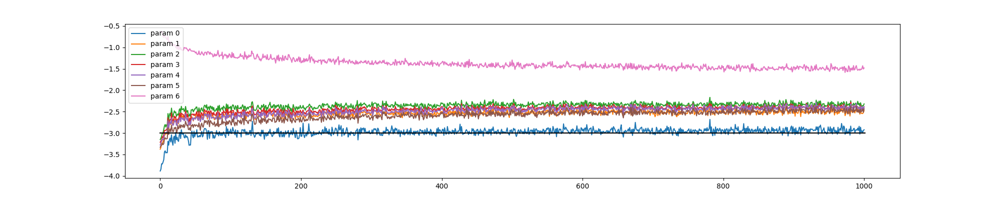

In [116]:
visualize_update_ratios(parameters, ud)

So, when we plot the `ud` ratios, you can see that they evolve over time. During initialization they take on certain values and these updates sort of like start stabilizing during training. But you'll also notice we have plotted a straight black line. This is an approximate value that is a rough guide for what the ratios should roughly be, which in this case is roughly \~`1e-3`. That basically means that there are some certain values in the data tensor and the updates to those values at every single iteration are no more than roughly $1000th$ of the actual magnitude in those tensors. If instead of roughly \~`1e-3`, the desired ratio value are much larger (e.g. \~`1e-1` or a log value of `-1` in this plot), then the data values are updating a lot, meaning that they are undergoing a lot of change. This is the case for the `ud` ratio values of the last layer, layer $6$. The reason why this layer is an outlier, is because this layer was artificially shrunk down to keep the softmax unconfident: see the `define_nn` function where we specifically do: `layers[-1].weight *= 0.1`. This artificially made inside that last layer tensor way too low and that is why we are temporarily getting a very high `ud` ratio. But as you can see, that ratio does decrease and then stabilizes over time, once that weight starts to learn. In general, it's helpful to look at the evolution of this `ud` ratio and as a rule of thumb to make sure that the values are not too much above roughly \~`1e-3` ($-3$ on this log plot). If it's below \~`1e-3`, usually this means that the parameters are not training fast enough. So, if our learning rate was very low, let's say $0.001$, this plot will typically reveal it:

45970
      0/ 200000: 3.2832


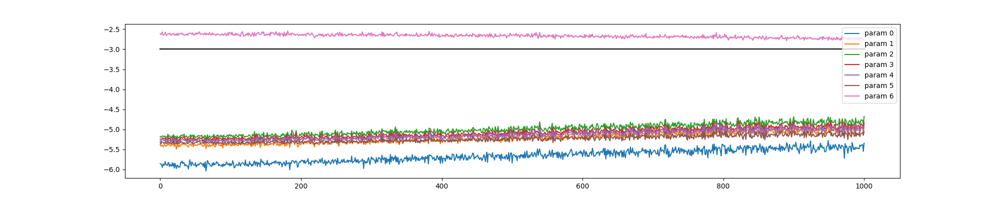

In [117]:
layers, parameters = define_nn()
lossi, ud = train(
    xtrain, ytrain, layers, parameters, break_at_step=1000, initial_lr=0.001
)
visualize_update_ratios(parameters, ud)

So you see how all of these updates are way too small. The size of the update is \~`1e-5` times smaller than the size of the data tensor values. And this is essentially a symptop of training way too slow. So this is another way to sometimes set the learning rate and to get a sense of what that learning rate should be after inspecting the `ud` ratio evolution. If anything, the default learning rate of $0.1$:

45970
      0/ 200000: 3.3024


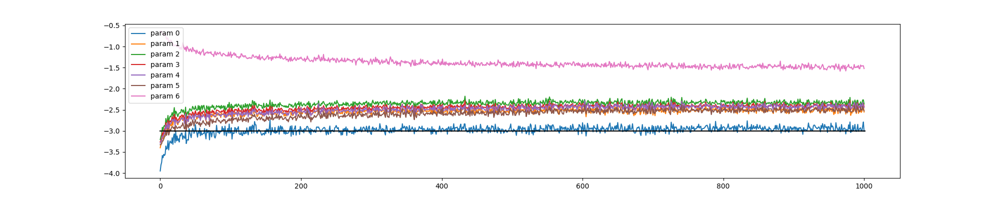

In [118]:
layers, parameters = define_nn()
lossi, ud = train(xtrain, ytrain, layers, parameters, break_at_step=1000)
visualize_update_ratios(parameters, ud)

is a little bit on the higher side. Because you see that we're above the black line of `1e-3` a little bit, but everything is somewhat stabilizing. So this looks like a pretty decent setting of learning rates. But this is something to look at in general. And when something is miscalibrated you will quickly realize it. So for example, everything looks pretty well behaved, right? But, just as a comparison, when things are not properly calibrated, what does that look like? For example, let's simulate the scenario were we initialize the weights of the `Linear` layers from a Gaussian distribution **without** the `fan_in` normalization (`torch.randn((fan_in, fan_out), generator=generator)` and not `torch.randn((fan_in, fan_out), generator=generator) / fan_in**0.5`). An easy way to do this without having to re-define the `Linear` class and re-write stuff is to simply call a function after defining our **nn** that multiplies each layer's weight tensor with a `fan_in**0.5` in order to revert the effect of division by the same number (that happened during initialization):

In [119]:
def revert_fan_in_normalization(layers):
    for layer in layers:
        if isinstance(layer, Linear):
            fan_in = layer.weight.shape[0]
            layer.weight.requires_grad = False
            # revert division by fan_in**0.5 and simulate initialization
            # of weight by sampling from plain Gaussian distribution:
            layer.weight *= fan_in**0.5
            layer.weight.requires_grad = True

In [120]:
layers, parameters = define_nn()
revert_fan_in_normalization(layers)

45970


Now, how do we notice in this case that something is off? Well, after training, the activations plot should tell you "woaw! your neurons are way too saturated":

      0/ 200000: 3.6452
layer 1 (      Tanh): mean +0.08, std 0.99, saturated: 98.19%
layer 3 (      Tanh): mean +0.01, std 0.98, saturated: 91.56%
layer 5 (      Tanh): mean -0.07, std 0.97, saturated: 90.38%
layer 7 (      Tanh): mean -0.09, std 0.97, saturated: 88.50%
layer 9 (      Tanh): mean +0.02, std 0.98, saturated: 90.75%


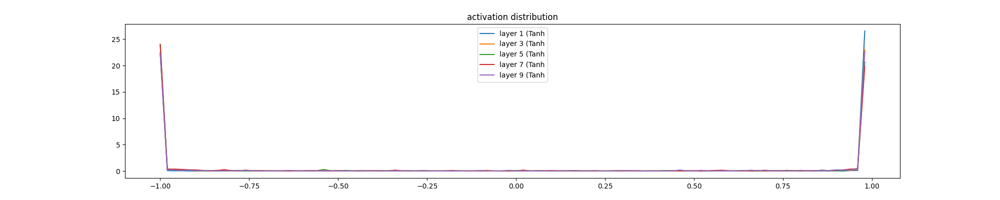

In [121]:
lossi, ud = train(xtrain, ytrain, layers, parameters, break_at_step=1000)
visualize_layer_values(layers)

Also, the gradients and weight gradients are going to be all messed up:

layer 1 (      Tanh): mean -0.004521, std 2.675036e-01
layer 3 (      Tanh): mean +0.000251, std 8.833456e-02
layer 5 (      Tanh): mean +0.000153, std 2.250751e-02
layer 7 (      Tanh): mean +0.000252, std 7.366180e-03
layer 9 (      Tanh): mean -0.000037, std 2.349474e-03
weight   (27, 10) | mean +0.130277 | std 9.217207e-01 | grad:data ratio 3.248308e-01
weight  (30, 100) | mean +0.008481 | std 4.626858e-01 | grad:data ratio 2.281539e-01
weight (100, 100) | mean +0.000163 | std 9.500726e-02 | grad:data ratio 5.676690e-02
weight (100, 100) | mean -0.000055 | std 3.163370e-02 | grad:data ratio 1.882637e-02
weight (100, 100) | mean -0.000115 | std 7.521240e-03 | grad:data ratio 4.498517e-03
weight (100, 100) | mean +0.000004 | std 2.363268e-03 | grad:data ratio 1.412265e-03
weight  (100, 27) | mean +0.000000 | std 3.211377e-02 | grad:data ratio 4.915577e-01


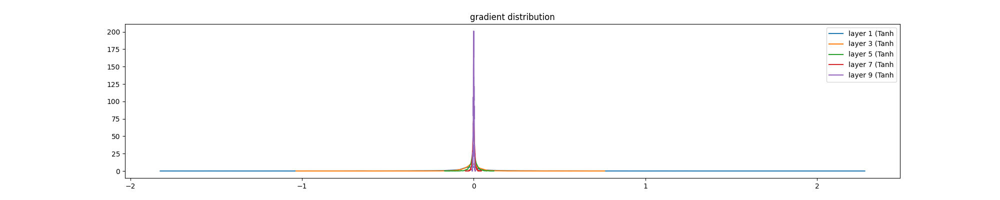

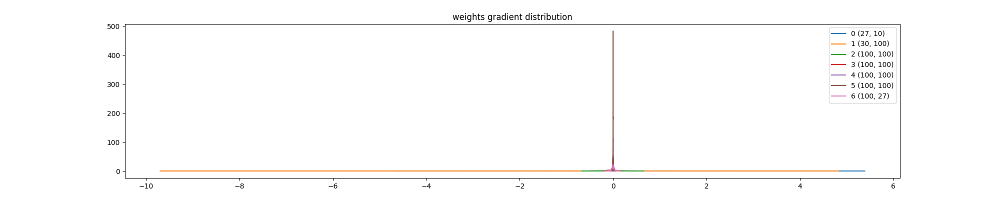

In [122]:
visualize_layer_values(layers, grad=True)
visualize_weight_gradients(parameters)

And if we look at the update-to-data ratios, they are also quite messed up and all over the places:

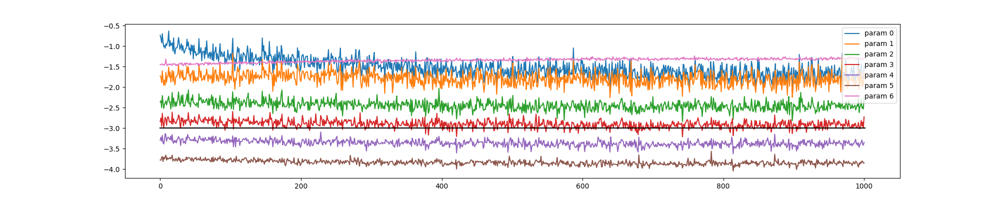

In [123]:
visualize_update_ratios(parameters, ud)

Yikes! As you can see, there is a lot of discrepancy in how fast these layers are learning and some of them are learning way too fast. And so `1e-1`, `1e-1.5`, etc. are very large numbers in terms of this ratio. Again, we should be somewhere around \~`1e-3` and not much more above that. So, this is how miscalibrations of your **nn**s are going to manifest. And therefore such plots are a good way of bringing those miscalibrations to your attention, so you can address them. Okay so so far we have seen that when we have such a linear $tanh$ sandwich as the one we have constructed, we can actually precisely calibrate the gains and make the activations, the gradients and the parameters and the updates all look pretty decent. But it definitely does feel like trying to balance a pencil on your finger and that's because the gain has to be very precisely calibrated. So now let's introduce **batchnorm** layers into the magical sandwich and let's see how that helps fix the problem, by placing them in-between our linear and tanh layers (note: placing them after the tanh layers would also yield similar results). Luckily, we have already implemented an option for that and all we have to do is to enable the **batchnorm** option. But now we will also add a **batchnorm** after the last layer too using the corresponding option:

In [124]:
layers, parameters = define_nn(batchnorm_enabled=True, add_batchnorm_last_layer=True)

47024


Now, let's train and look at the distributions:

      0/ 200000: 3.2929
layer 2 (      Tanh): mean -0.00, std 0.63, saturated: 3.00%
layer 5 (      Tanh): mean -0.01, std 0.64, saturated: 2.62%
layer 8 (      Tanh): mean -0.00, std 0.64, saturated: 2.59%
layer 11 (      Tanh): mean +0.00, std 0.65, saturated: 2.00%
layer 14 (      Tanh): mean -0.00, std 0.65, saturated: 2.16%
layer 2 (      Tanh): mean +0.000000, std 4.195873e-03
layer 5 (      Tanh): mean -0.000000, std 3.432381e-03
layer 8 (      Tanh): mean +0.000000, std 3.094697e-03
layer 11 (      Tanh): mean -0.000000, std 2.804628e-03
layer 14 (      Tanh): mean +0.000000, std 2.597143e-03
weight   (27, 10) | mean +0.000000 | std 1.184449e-02 | grad:data ratio 1.183229e-02
weight  (30, 100) | mean +0.000087 | std 1.112692e-02 | grad:data ratio 3.559509e-02
weight (100, 100) | mean -0.000042 | std 8.425396e-03 | grad:data ratio 5.038401e-02
weight (100, 100) | mean +0.000051 | std 7.195173e-03 | grad:data ratio 4.265793e-02
weight (100, 100) | mean -0.000020 | std 6.579364e-0

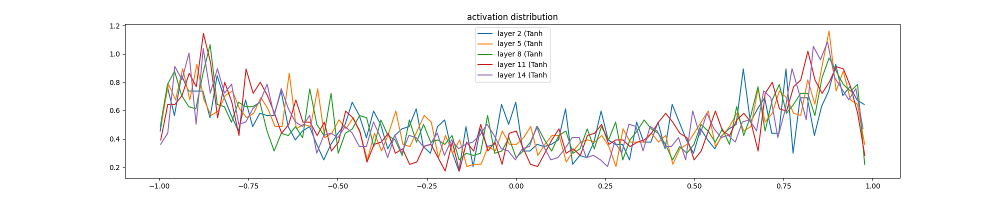

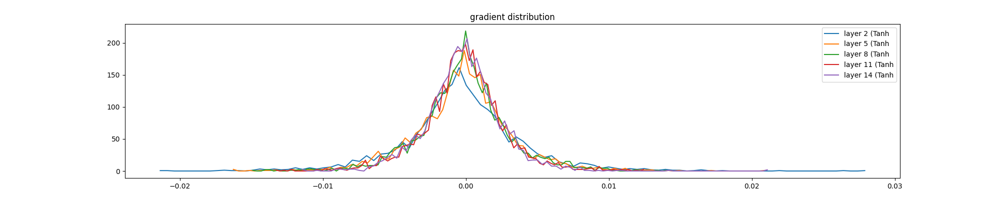

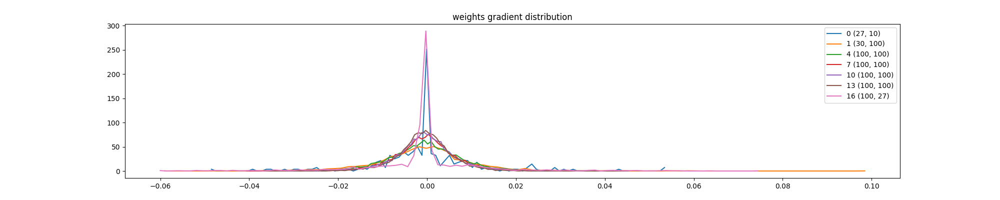

In [125]:
lossi, ud = train(xtrain, ytrain, layers, parameters, break_at_step=1000)
visualize_layer_values(layers)
visualize_layer_values(layers, grad=True)
visualize_weight_gradients(parameters)

which of course look very good. And they are necessarily going to look good because now before every single `Tanh` layer there's a **batchnorm** happening. This yields a saturation of ~$2\%$ and roughly equal std across all layers and everything looks very homogeneous in the activations distribution, with the gradient and weight gradient distributions also looking great. Also, the updates:

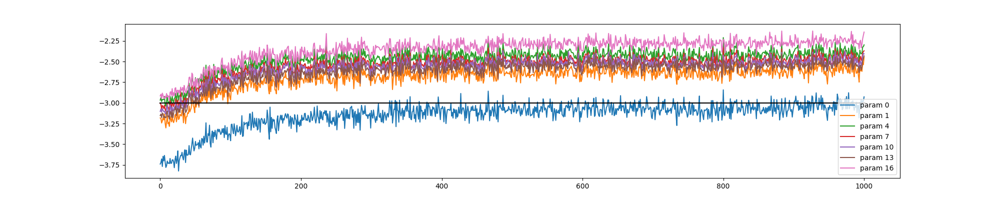

In [126]:
visualize_update_ratios(parameters, ud)

also look pretty reasonable, with all parameters training at around roughly the same rate. Now, what we have gained is that we can now be slightly less brittle with respect to the gain values of the weights. Meaning, that if for example we make the gain be $0.2$ (much lower than the default $tanh$ gain of $5/3$) and then train and print the same distributions:

47024
      0/ 200000: 3.3123
layer 2 (      Tanh): mean -0.01, std 0.65, saturated: 2.22%
layer 5 (      Tanh): mean +0.00, std 0.66, saturated: 1.75%
layer 8 (      Tanh): mean +0.00, std 0.66, saturated: 1.25%
layer 11 (      Tanh): mean -0.00, std 0.67, saturated: 0.69%
layer 14 (      Tanh): mean -0.00, std 0.67, saturated: 0.38%
layer 2 (      Tanh): mean +0.000000, std 1.335050e-03
layer 5 (      Tanh): mean -0.000000, std 1.099874e-03
layer 8 (      Tanh): mean +0.000000, std 9.822736e-04
layer 11 (      Tanh): mean +0.000000, std 9.222270e-04
layer 14 (      Tanh): mean -0.000000, std 1.033894e-03
weight   (27, 10) | mean +0.000000 | std 8.089920e-03 | grad:data ratio 8.082327e-03
weight  (30, 100) | mean +0.000474 | std 1.413297e-02 | grad:data ratio 2.332171e-01
weight (100, 100) | mean +0.000169 | std 6.806228e-03 | grad:data ratio 2.281708e-01
weight (100, 100) | mean -0.000007 | std 5.881962e-03 | grad:data ratio 2.136713e-01
weight (100, 100) | mean -0.000011 | std 5.632

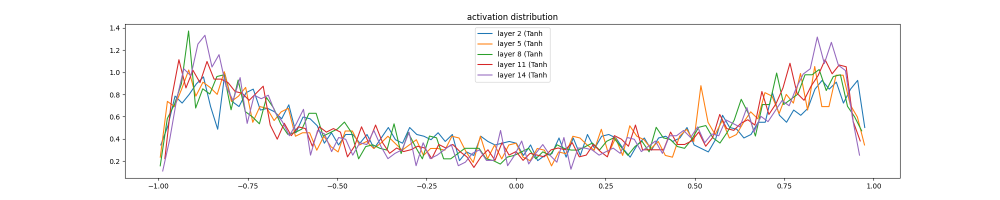

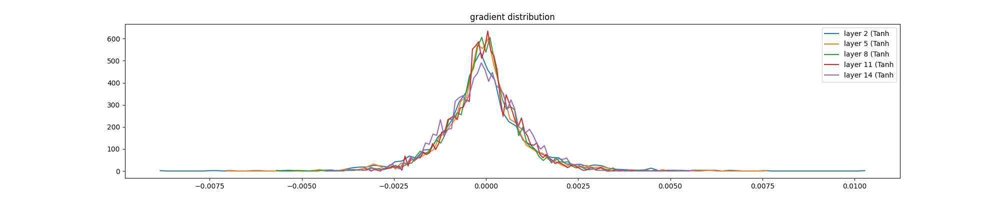

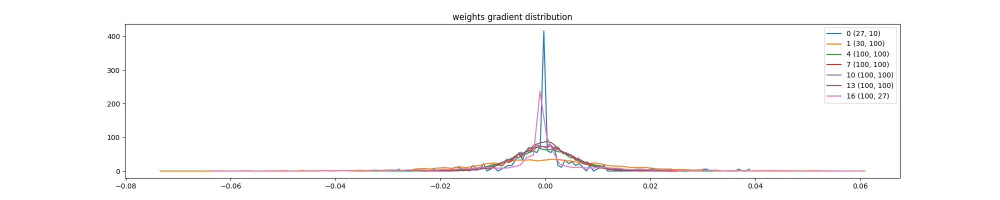

In [127]:
layers, parameters = define_nn(batchnorm_enabled=True, add_batchnorm_last_layer=True, weight_gain=0.2)
lossi, ud = train(xtrain, ytrain, layers, parameters, break_at_step=1000)
visualize_layer_values(layers)
visualize_layer_values(layers, grad=True)
visualize_weight_gradients(parameters)

They will all look pretty ok and unaffected! However, if we plot the updates:

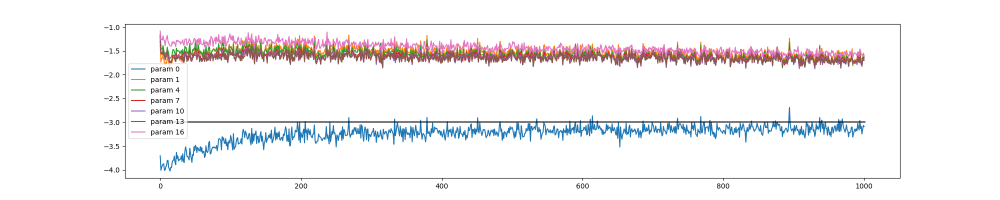

In [128]:
visualize_update_ratios(parameters, ud)

we see that these do in fact change. And so even though the forward and backward pass to a very large extent look okay because of the backward pass of the **batchnorm** and how the specifically the scale of the incoming activations interacts in the **batchnorm** and its backward pass, the decrease of the gain is actually changing the scale of the updates on these parameters. So, the gradients on these weights are affected. So, we still don't get a completely free pass to pass any arbitrary weight gain, but everything else is significantly more robust in terms of the forward and backward passes and the weight gradients. It's just that you may in such a case need to retune the learning rate if you are changing sufficiently the scale of the activations that are coming into the **batchnorm** layers. To verify this, we can see how making the gain to a greater value like $5.0$:

47024
      0/ 200000: 3.3023
layer 2 (      Tanh): mean -0.00, std 0.63, saturated: 2.94%
layer 5 (      Tanh): mean -0.00, std 0.63, saturated: 2.19%
layer 8 (      Tanh): mean -0.00, std 0.64, saturated: 2.69%
layer 11 (      Tanh): mean -0.01, std 0.63, saturated: 2.59%
layer 14 (      Tanh): mean +0.00, std 0.64, saturated: 2.56%
layer 2 (      Tanh): mean +0.000000, std 3.920174e-03
layer 5 (      Tanh): mean +0.000000, std 3.452033e-03
layer 8 (      Tanh): mean +0.000000, std 3.197465e-03
layer 11 (      Tanh): mean +0.000000, std 2.810341e-03
layer 14 (      Tanh): mean +0.000000, std 2.514210e-03
weight   (27, 10) | mean -0.000000 | std 9.187427e-03 | grad:data ratio 9.178431e-03
weight  (30, 100) | mean +0.000070 | std 2.942364e-03 | grad:data ratio 3.144867e-03
weight (100, 100) | mean -0.000039 | std 2.834318e-03 | grad:data ratio 5.686736e-03
weight (100, 100) | mean -0.000003 | std 2.567600e-03 | grad:data ratio 5.097613e-03
weight (100, 100) | mean -0.000004 | std 2.376

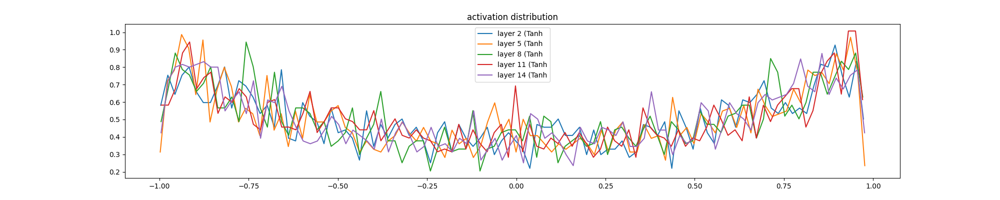

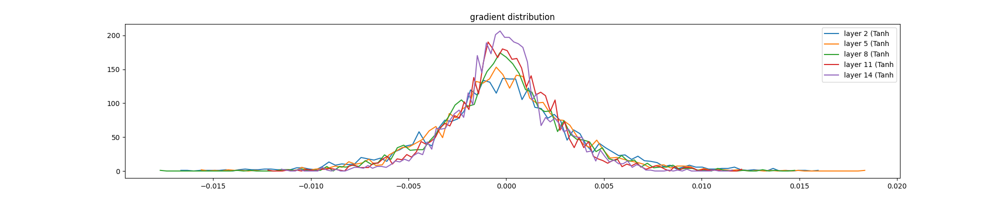

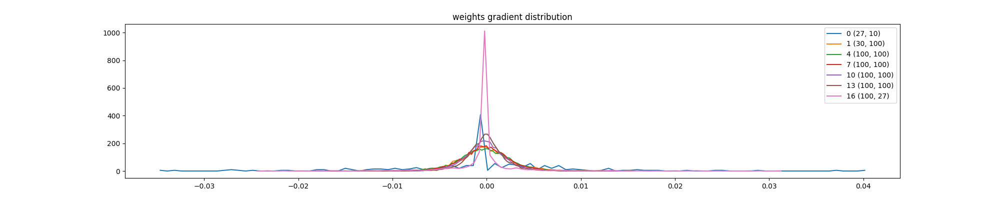

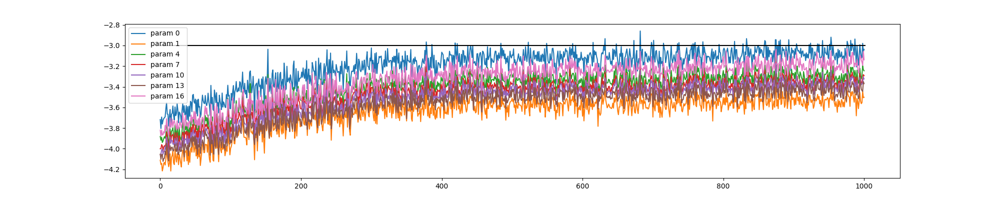

In [129]:
layers, parameters = define_nn(batchnorm_enabled=True, add_batchnorm_last_layer=True, weight_gain=5.0)
lossi, ud = train(xtrain, ytrain, layers, parameters, break_at_step=1000)
visualize_layer_values(layers)
visualize_layer_values(layers, grad=True)
visualize_weight_gradients(parameters)
visualize_update_ratios(parameters, ud)

now causes the updates to come out lower, as a result. Finally let's now remove the weight gain by setting it to $1.0$ notice that with **batchnorm** enabled we can now also skip the `fan_in` normalization at initialization. So, like we did before, if we define our **nn** by sampling the initial weights from a plain Gaussian:

47024
      0/ 200000: 3.3167
layer 2 (      Tanh): mean -0.00, std 0.63, saturated: 2.41%
layer 5 (      Tanh): mean -0.00, std 0.63, saturated: 2.22%
layer 8 (      Tanh): mean +0.00, std 0.63, saturated: 2.69%
layer 11 (      Tanh): mean -0.00, std 0.64, saturated: 2.66%
layer 14 (      Tanh): mean -0.00, std 0.63, saturated: 2.94%
layer 2 (      Tanh): mean +0.000000, std 2.214382e-03
layer 5 (      Tanh): mean -0.000000, std 1.974707e-03
layer 8 (      Tanh): mean -0.000000, std 1.773101e-03
layer 11 (      Tanh): mean +0.000000, std 1.651553e-03
layer 14 (      Tanh): mean +0.000000, std 1.543592e-03
weight   (27, 10) | mean +0.000000 | std 5.474314e-03 | grad:data ratio 5.469583e-03
weight  (30, 100) | mean -0.000017 | std 1.447429e-03 | grad:data ratio 1.412271e-03
weight (100, 100) | mean -0.000005 | std 7.742328e-04 | grad:data ratio 7.767763e-04
weight (100, 100) | mean +0.000004 | std 6.885816e-04 | grad:data ratio 6.835867e-04
weight (100, 100) | mean -0.000001 | std 6.056

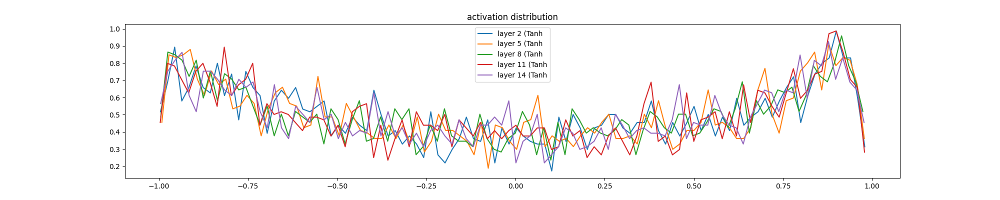

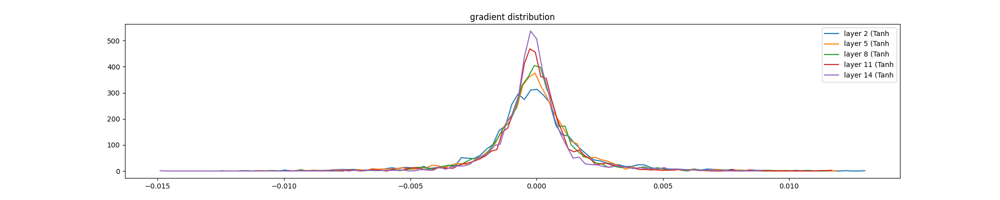

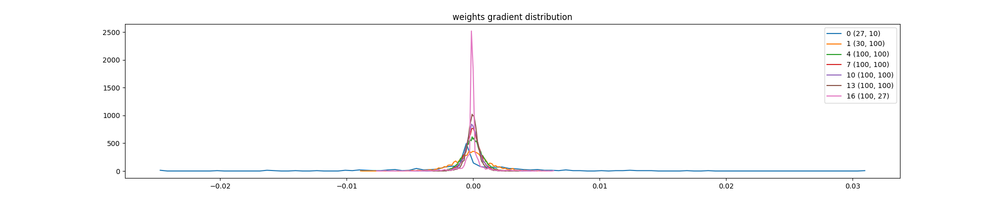

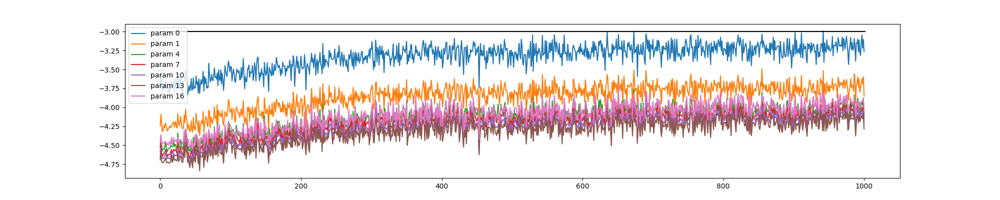

In [130]:
layers, parameters = define_nn(
    batchnorm_enabled=True, add_batchnorm_last_layer=True, weight_gain=1.0
)
revert_fan_in_normalization(layers)
lossi, ud = train(xtrain, ytrain, layers, parameters, break_at_step=1000)
visualize_layer_values(layers)
visualize_layer_values(layers, grad=True)
visualize_weight_gradients(parameters)
visualize_update_ratios(parameters, ud)

everything looks pretty much ok. But from the update plot you can see that everything looks below `1e-3`, so we would have to bump up the learning rate in order to make sure that we are training more properly. Intuitively, we would probably need to 10x the learning rate from $0.1$ (default) to $1.0$. Let's try it out:

47024
      0/ 200000: 3.3172
layer 2 (      Tanh): mean -0.01, std 0.62, saturated: 3.81%
layer 5 (      Tanh): mean -0.02, std 0.63, saturated: 3.34%
layer 8 (      Tanh): mean -0.04, std 0.63, saturated: 3.31%
layer 11 (      Tanh): mean -0.01, std 0.64, saturated: 2.94%
layer 14 (      Tanh): mean +0.02, std 0.64, saturated: 3.09%
layer 2 (      Tanh): mean -0.000000, std 3.939333e-03
layer 5 (      Tanh): mean -0.000000, std 3.454237e-03
layer 8 (      Tanh): mean +0.000000, std 3.411754e-03
layer 11 (      Tanh): mean +0.000000, std 3.161399e-03
layer 14 (      Tanh): mean -0.000000, std 3.132902e-03
weight   (27, 10) | mean -0.000000 | std 8.739601e-03 | grad:data ratio 8.459278e-03
weight  (30, 100) | mean -0.000040 | std 2.694967e-03 | grad:data ratio 2.621891e-03
weight (100, 100) | mean +0.000002 | std 1.324371e-03 | grad:data ratio 1.327684e-03
weight (100, 100) | mean +0.000000 | std 1.155196e-03 | grad:data ratio 1.146130e-03
weight (100, 100) | mean -0.000003 | std 1.141

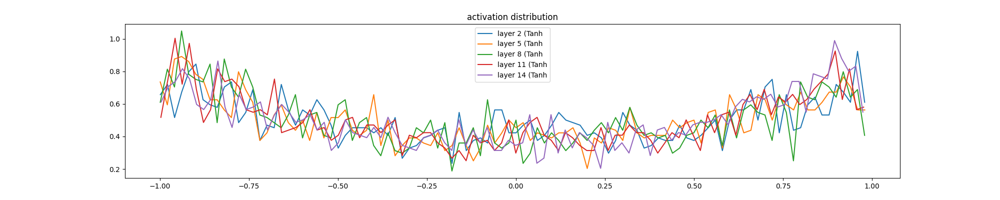

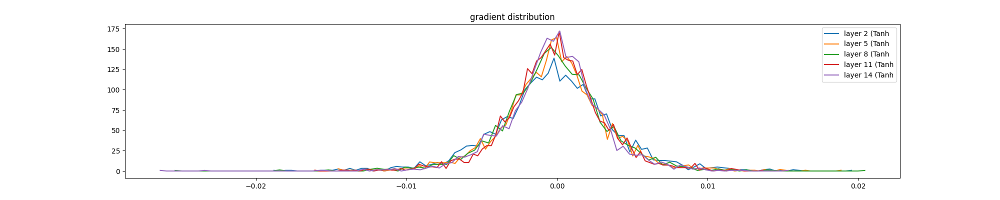

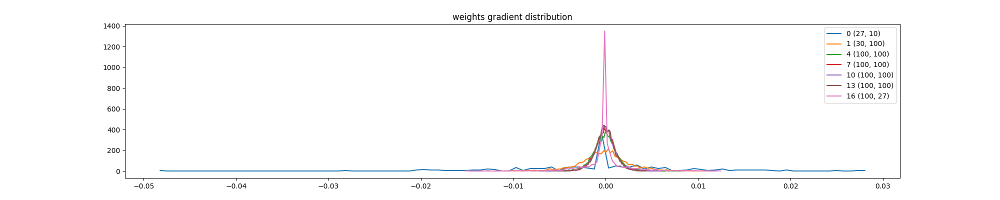

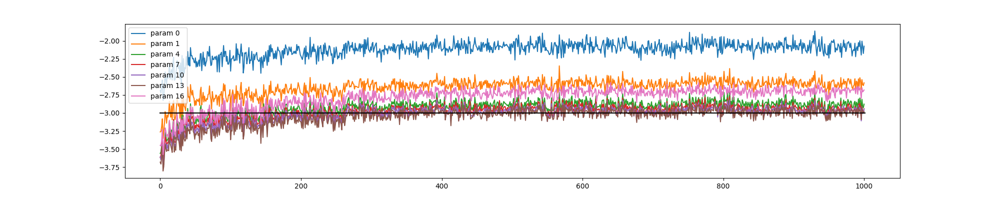

In [131]:
layers, parameters = define_nn(
    batchnorm_enabled=True, add_batchnorm_last_layer=True, weight_gain=1.0
)
revert_fan_in_normalization(layers)
lossi, ud = train(
    xtrain, ytrain, layers, parameters, break_at_step=1000, initial_lr=1.0
)
visualize_layer_values(layers)
visualize_layer_values(layers, grad=True)
visualize_weight_gradients(parameters)
visualize_update_ratios(parameters, ud)

everything again looks good and voilà! Now our updates are more reasonable. So, long story short, with **barchnorm**, we are now significantly more robust to the gain of these linear layers, whether or not we have to apply the `fan_in` normalization, with the caveat (in terms of the former) that we do have to worry about the update scales and making sure that the learning rate is properly calibrated here. So, the forward and backward pass statistics are all looking significantly more behaved, except for the scales of the updates that should be taken into consideration.

## Summary

Ok, so now let's summarize (again, lol). There are three things this section was intended to teach:

1. introducing you to **batchnorm**, which is one of the first modern innovations that helped stabilize very deep **nn**s and their training
2. PyTorch-ifying some of our code by wrapping it up into layer modules (`Linear`, `BatchNorm1D`, `Tanh`, etc.) that can be stacked up into **nn** like lego building blocks. Since these synonymous layers exist as objects in the `torch.nn` API, the way we have constructed it, we could easily replace each one of our custom modules (`Linear` with `nn.Linear` and so on) and everything would probably work just fine.
3. present you with the diagnostic tools that you would use to understand whether your **nn** is in a good state dynamically. This means looking at histograms of the forward pass activations and backward pass gradients. And then also the weights that are going to be activated as part of stochastic gradient descent by looking at their means, stds and also the gradient-to-data ratios or even better, the update-to-data ratios. And we saw that what people usually do is look at the evolution of these update-to-data ratios, instead of single step snapshots frozen in time, and make sure everything looks fine. In particular, we highlighted that around `1e-3` ($-3$ on the log scale) is a good rough heuristic of what you want this ratio to be and if it's way too high, then probably the learning rate is a little too big. Whereas, if it's too small, then the learning rate is probably too small. So, these are the things that you might want to play with when you want to get your **nn** to work very well.

Now, there are certain things we did not try to achieve in this lesson. As an example, we did not try to beat the performace from our previous lessons. If we do actually try to, by using **batchnorm** layers (by using the learning rate finding mechanism described in the previous lesson), we would end up with results that are very very similar to the ones that we obtained before. And in that case, that would be because our performance now is not bottlenecked by the optimization, which is what **batchnorm** is helping with. But, the performance in actually most likely bottlenecked by the context length we are choosing as our context. Currently we are taking in $3$ characters in order to predict the $4th$ one. To go beyond that, we would need to look at more powerful architectures, like RNNs and Transformers, in order to further push the log probabilities that we're achieving on this dataset. Also, we did not give a full explanation of all of these activations and the gradients (e.g. from the backward pass or the weights). Maybe you found those parts slightly unintuitive and maybe you're slightly confused about: okay, if I change the gain, how come that we need a different learning rate? And the reason we didn't go into full detail to make such questions clearer is because we'd have to actually look at the backward pass of *all* these different layers and get an intuitive understanding of how that works, and so we did not go into that in this lesson. The purpose really was just to introduce you to the diagnostic tools and what they look like. But of course there's still a lot of work remaining on the intuitive level to understand the initialization, the backward pass and how all of these interact.

## Outro

We certainly haven't *solved* initialization, nor have we *solved* **backprop**, or anything of that sorts. These are still very much an active area of research with lots of people trying to figure out what the best way is to initialize these networks, what is the best update rule to use and so on. So none of all this is *solved* and we don't really have all the answers to all these cases but at least we are making progress and at least we have some tools to tell us whether or not things are on the right track, for now. So, all in all, we have made progress in this lesson and I hope you enjoyed it. See you in the next lesson!